# Credit Risk Modeling: Probability of Default Classification

## Introduction

Now that we've removed outliers and we made sure there's no missing data from out data set, we can begin modeling to **predict the probability of default**.

**Probability of default**

Recall that the probability of default is the likelihood that someone will fail to repay a loan. This is expressed as a probability which is a value between zero and one. These probabilities are associated with our loan status column where a 1 is a default, and a 0 is a non default.

The resulting predictions give us probabilities of default. The closer the value is to 1, the higher the probability of the loan being a default.

**To get these probabilities, we'll be:**

* Encode Categorical features using CatBoost Encoder.
* Scaling and Transformation: Standardization
* Deal with Imbalanced  Target variable using SMOTE.
* Training multiple Classification algorithms.
* Utilize **OPTUNA: Hyper-parameter framework** where applicable to ensure every algorithm will result in best prediction possible.
* Finally, evaluate these Models *(with consideration of the Imbalanced Data)*.

**Classification Models:**

* Logistic Regression (Baseline Model)
* Random Forests
* XGBoost
* LightGBM
* Stacking Classifier


## Import the necessary Libraries

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os 
import category_encoders as ce
from imblearn.over_sampling import SMOTE
import optuna
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import StackingClassifier
import shap
from sklearn.metrics import precision_recall_curve, f1_score, auc
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score
from sklearn.metrics import accuracy_score,log_loss
from sklearn import tree, metrics
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
import time
from sklearn.model_selection import cross_val_score
plt.style.use('ggplot')

print('***Libraries are imported***')

***Libraries are imported***


In [9]:
df = pd.read_csv('credit_risk_quant.csv')

In [10]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
1,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
2,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
3,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
4,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


In [11]:
df.shape

(25183, 12)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25183 entries, 0 to 25182
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  25183 non-null  int64  
 1   person_income               25183 non-null  int64  
 2   person_home_ownership       25183 non-null  object 
 3   person_emp_length           25183 non-null  float64
 4   loan_intent                 25183 non-null  object 
 5   loan_grade                  25183 non-null  object 
 6   loan_amnt                   25183 non-null  int64  
 7   loan_int_rate               25183 non-null  float64
 8   loan_status                 25183 non-null  int64  
 9   loan_percent_income         25183 non-null  float64
 10  cb_person_default_on_file   25183 non-null  object 
 11  cb_person_cred_hist_length  25183 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 2.3+ MB


## Features Selection: Define/Select Features

In [13]:
# let's check our final df columns:
df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length'],
      dtype='object')

In [14]:
# Let's define/select our features:
features = ['person_age', 'person_income', 'person_home_ownership',
            'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
            'loan_int_rate', 'loan_percent_income','cb_person_default_on_file', 
            'cb_person_cred_hist_length']

# And, Now let's define X and y:
X = df[features]
y = df.loan_status

## CatBoost Encoder

* Catboost is a recently created target-based categorical encoder.
* It is intended to overcome target leakage problems inherent in (Leave-one-out) LOO.
* To prevent overfitting, the process of target encoding for train dataset is repeated several times on shuffled versions of the dataset and results are averaged.


In [15]:
# Define catboost encoder
cbe_encoder = ce.CatBoostEncoder()

# Fit encoder and transform the features
cbe_encoder.fit(X, y)
X_cbe = cbe_encoder.transform(X)

In [16]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
1,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
2,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
3,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
4,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


In [17]:
X_cbe.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,21,9600,0.072474,5.0,0.171510,0.164885,1000,11.14,0.10,0.188284,2
1,25,9600,0.129350,1.0,0.272659,0.213655,5500,12.87,0.57,0.188284,3
2,23,65500,0.315111,4.0,0.272659,0.213655,35000,15.23,0.53,0.188284,2
3,24,54400,0.315111,8.0,0.272659,0.213655,35000,14.27,0.55,0.384785,4
4,21,9900,0.072474,2.0,0.156223,0.101583,2500,7.14,0.25,0.188284,2


<AxesSubplot:>

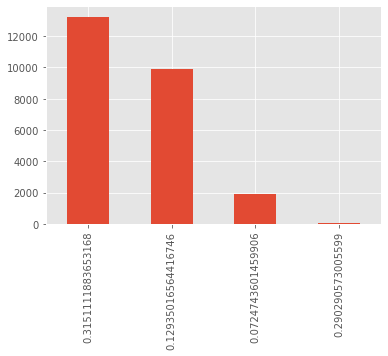

In [18]:
X_cbe.person_home_ownership.value_counts().plot.bar()

In [19]:
X_cbe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25183 entries, 0 to 25182
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  25183 non-null  int64  
 1   person_income               25183 non-null  int64  
 2   person_home_ownership       25183 non-null  float64
 3   person_emp_length           25183 non-null  float64
 4   loan_intent                 25183 non-null  float64
 5   loan_grade                  25183 non-null  float64
 6   loan_amnt                   25183 non-null  int64  
 7   loan_int_rate               25183 non-null  float64
 8   loan_percent_income         25183 non-null  float64
 9   cb_person_default_on_file   25183 non-null  float64
 10  cb_person_cred_hist_length  25183 non-null  int64  
dtypes: float64(7), int64(4)
memory usage: 2.1 MB


## Train/Test Split

Now, let's split our data (X) into training and testing splits, without letting a model learn anything about the test split.

let's have 75/25 Train/Test split:

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_cbe, 
                                                    y, 
                                                    test_size=.25, 
                                                    random_state=1981)

## Scaling and Transformation: Standardization

**Standardization** finds the mean of our data and centers the distribution around it, calculating the number of standard deviations away from the mean each point is. The number of standard deviations are then used as our new values. This centers the data around 0 but technically has no limit to the maximum and minimum values.

In [21]:
# Import StandardScaler:
from sklearn.preprocessing import StandardScaler

# Instantiate StandardScaler:
scaler = StandardScaler()

# Fit & transform  scaler to the data:
X_train = scaler.fit_transform(X_train.astype(np.float))
X_test = scaler.transform(X_test.astype(np.float))

## SMOTE: Dealing with imbalanced Target Variable (Loan Status)

**SMOTE stands for Synthetic Minority Over-Sampling Technique.** Just like the name suggests, SMOTE generates a synthetic data for the minority class and then proceeds by joining the points of the minority class with line segments and then places artificial points on these lines:


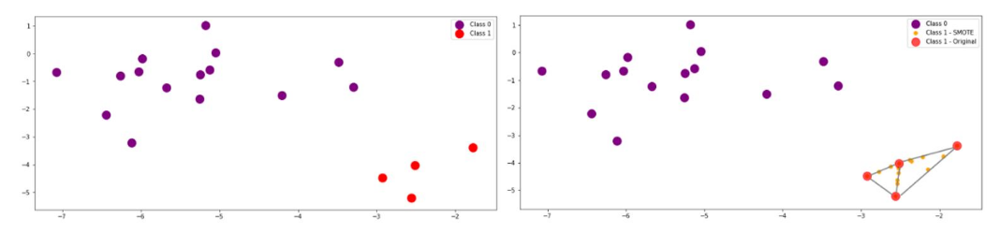


The heart of SMOTE is the construction of the minority classes. The intuition behind the construction algorithm is simple. You have already studied that oversampling causes overfitting, and because of repeated instances, the decision boundary gets tightened. What if you could generate similar samples instead of repeating them? In the original SMOTE paper (linked above) it has been shown that to a machine learning algorithm, these newly constructed instances are not exact copies, and thus it softens the decision boundary and thereby helping the algorithm to approximate the hypothesis more accurately.

**Under the hood, the SMOTE algorithm works in below simple steps:**
* Choose a minority class input vector.
* Find its ***k-nearest neighbors*** (k_neighbors is specified as an argument in the SMOTE() function).
* Choose one of these neighbors and place a synthetic point anywhere on the line joining the point under consideration and its chosen neighbor.
* Repeat the steps until data is balance.
* SMOTE is implemented in Python using the imblearn library.


In [22]:

sm = SMOTE(random_state = 1981)

In [23]:
X_train_new, y_train_new = sm.fit_resample(X_train, y_train.ravel())

Text(0.5, 1.0, 'Dependent Variable - Imbalanced (Before SMOTE)')

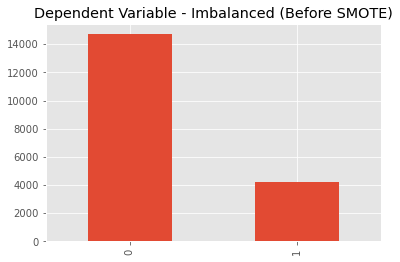

In [24]:
# observe that data has been imbalanced: (Before SMOTE)
pd.Series(y_train).value_counts().plot.bar()
plt.title('Dependent Variable - Imbalanced (Before SMOTE)')

Text(0.5, 1.0, 'Dependent Variable - Balanced (After SMOTE)')

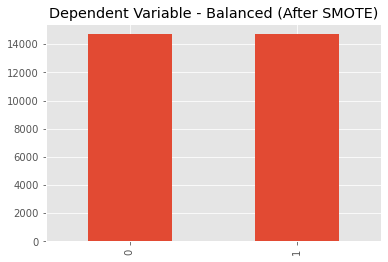

In [25]:
# observe that data has been balanced: (After SMOTE)
pd.Series(y_train_new).value_counts().plot.bar()
plt.title('Dependent Variable - Balanced (After SMOTE)')

## Modelling

### 1. Logistic Regression:

#### 1.1 Fitting a Logistic Regression Model: Imbalanced Target Variable

In [20]:
# Import LogisticRegression
from sklearn.linear_model import LogisticRegression

# Import confusion_matrix
from sklearn.metrics import confusion_matrix

from sklearn.metrics import precision_recall_curve, f1_score, auc
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score
from sklearn.metrics import accuracy_score,log_loss
from sklearn import tree, metrics

In [21]:
# Declare a variable called logreg_i_b, and assign it: LogisticRegression:
logreg_i_b = LogisticRegression(random_state=1981)

# Call fit() on logreg_i_b:
logreg_i_b.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_b = logreg_i_b.predict(X_test)

In [22]:
# Create predictions of probability for loan status using test data
preds_i_b = logreg_i_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_i_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_i_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_i_b.reset_index(drop = True), preds_df_i_b], axis = 1))

    loan_status  prob_default
0             0      0.033399
1             0      0.034679
2             0      0.066827
3             1      0.101349
4             0      0.108065
5             1      0.952216
6             0      0.114470
7             0      0.231689
8             1      0.139134
9             0      0.064133
10            1      0.854183
11            0      0.116323
12            1      0.035586
13            0      0.021049
14            1      0.737871
15            0      0.062320
16            0      0.016546
17            0      0.006088
18            0      0.060053
19            0      0.075927


In [30]:
# Create a dataframe for the probabilities of default
preds_df_i_b = pd.DataFrame(preds_i_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_i_b['loan_status'] = preds_df_i_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("Logistic Regression Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_i_b['loan_status'], target_names=target_names, digits=6))

Logistic Regression Model - Imbalanced
Accuracy: 86.43583 %
********************************************************
0    5293
1    1003
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.878708  0.956406  0.915912      4863
     Default   0.788634  0.551989  0.649425      1433

    accuracy                       0.864358      6296
   macro avg   0.833671  0.754197  0.782669      6296
weighted avg   0.858207  0.864358  0.855258      6296



In [34]:
print('Logistic Regression Model - Imabalanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_i_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

Logistic Regression Model - Imabalanced: confusion_matrix


Predicted     0     1   All
True                       
0          4651   212  4863
1           642   791  1433
All        5293  1003  6296


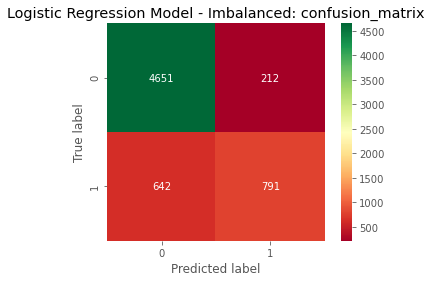

In [35]:
mat = confusion_matrix(y_test, y_pred_i_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Logistic Regression Model - Imbalanced: confusion_matrix');

Logistic Regression model - Imabalnced - AUC: 87.18716 %


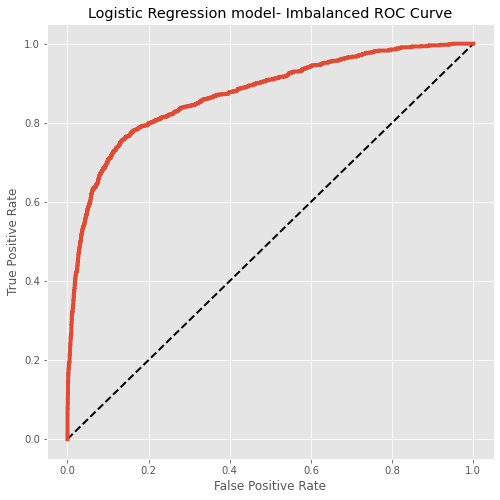

In [36]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i = logreg_i_b.predict_proba(X_test)[:,1]

print("Logistic Regression model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_i)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='Logistic Regression model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression model- Imbalanced ROC Curve')
plt.grid(True)
plt.show();

#### 1.2 Fitting a Logistic Regression Model: Balanced Target Variable

In [37]:
# Declare a variable called logreg_b_b, and assign it: LogisticRegression:
logreg_b_b = LogisticRegression(random_state=1981)

# Call fit() on logreg_b_b:
logreg_b_b.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_b_b 
y_pred_b_b = logreg_b_b.predict(X_test)

In [38]:
# Create predictions of probability for loan status using test data
preds_b_b = logreg_b_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_b_b = pd.DataFrame(preds_b_b[:,1][0:20], columns = ['prob_default'])
true_df_b_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_b_b.reset_index(drop = True), preds_df_b_b], axis = 1))

    loan_status  prob_default
0             0      0.124966
1             0      0.153839
2             0      0.233837
3             1      0.284450
4             0      0.299670
5             1      0.983991
6             0      0.279235
7             0      0.518278
8             1      0.361409
9             0      0.152571
10            1      0.951316
11            0      0.341225
12            1      0.112828
13            0      0.038576
14            1      0.900976
15            0      0.172791
16            0      0.047738
17            0      0.020721
18            0      0.154617
19            0      0.219365


In [39]:
# Create a dataframe for the probabilities of default
preds_df_b_b = pd.DataFrame(preds_b_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_b_b['loan_status'] = preds_df_b_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("Logistic Regression Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_b_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_b_b['loan_status'], target_names=target_names, digits=6))

Logistic Regression Model - Balanced
Accuracy: 81.00381 %
********************************************************
0    4263
1    2033
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.930096  0.815340  0.868946      4863
     Default   0.558288  0.792045  0.654934      1433

    accuracy                       0.810038      6296
   macro avg   0.744192  0.803692  0.761940      6296
weighted avg   0.845471  0.810038  0.820236      6296



In [41]:
print('Logistic Regression Model - Balanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_b_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

Logistic Regression Model - Balanced: confusion_matrix


Predicted     0     1   All
True                       
0          3965   898  4863
1           298  1135  1433
All        4263  2033  6296


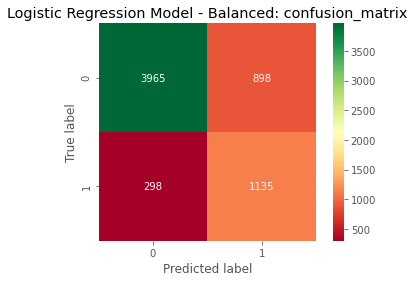

In [42]:
mat = confusion_matrix(y_test, y_pred_b_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Logistic Regression Model - Balanced: confusion_matrix');

Logistic Regression model - Balanced - AUC: 87.30497 %


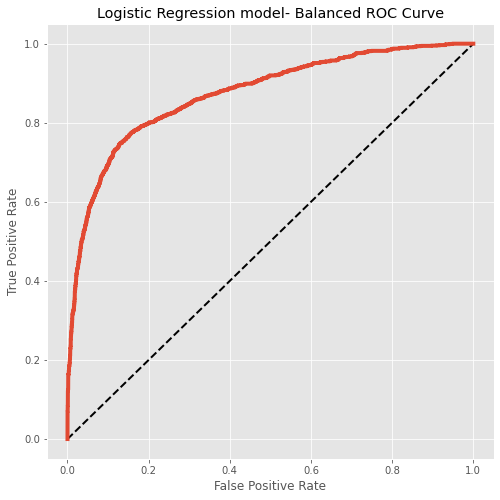

In [43]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b = logreg_b_b.predict_proba(X_test)[:,1]

print("Logistic Regression model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_b)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='Logistic Regression model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression model- Balanced ROC Curve')
plt.grid(True)
plt.show();

#### 1.3 Logistic Regression Model: Hyperparameters Tuning Using Optuna (Imbalanced Target Variable)

In [183]:
def objective(trial):
    
    logreg_max_iter = trial.suggest_int("logreg_max_iter", 100, 1000, step=50)
    logreg_solver = trial.suggest_categorical("logreg_solver",['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'])
   # logreg_penalty = trial.suggest_categorical("logreg_penalty",['l1', 'l2', 'elasticnet', 'none'])
    logreg_class_weight = trial.suggest_categorical('logreg_class_weight', ['balanced', None])
    classifier_obj = LogisticRegression(max_iter=logreg_max_iter, 
                                        solver=logreg_solver,
                                        class_weight = logreg_class_weight,
                                       # penalty=logreg_penalty,
                                        random_state=1981)

    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy


In [184]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 09:01:38,498] A new study created in memory with name: no-name-821f0236-775f-4907-a493-3bf09d34fc60


Optimizing the parameters


[I 2022-01-19 09:01:38,790] Trial 0 finished with value: 0.8623386541902711 and parameters: {'logreg_max_iter': 150, 'logreg_solver': 'newton-cg', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8623386541902711.
[I 2022-01-19 09:01:39,026] Trial 1 finished with value: 0.8076453522637713 and parameters: {'logreg_max_iter': 750, 'logreg_solver': 'saga', 'logreg_class_weight': 'balanced'}. Best is trial 0 with value: 0.8623386541902711.
[I 2022-01-19 09:01:39,307] Trial 2 finished with value: 0.8623386541902711 and parameters: {'logreg_max_iter': 500, 'logreg_solver': 'newton-cg', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8623386541902711.
[I 2022-01-19 09:01:39,496] Trial 3 finished with value: 0.8623386541902711 and parameters: {'logreg_max_iter': 600, 'logreg_solver': 'lbfgs', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8623386541902711.
[I 2022-01-19 09:01:39,843] Trial 4 finished with value: 0.8623386541902711 and parameters: {'logreg_ma

[I 2022-01-19 09:01:46,972] Trial 35 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 400, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:47,195] Trial 36 finished with value: 0.8623386541902711 and parameters: {'logreg_max_iter': 200, 'logreg_solver': 'lbfgs', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:47,432] Trial 37 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 300, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:47,653] Trial 38 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 150, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:47,953] Trial 39 finished with value: 0.8623386541902711 and parameters: {'logre

[I 2022-01-19 09:01:55,939] Trial 70 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 750, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:56,083] Trial 71 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 100, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:56,329] Trial 72 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 250, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:56,577] Trial 73 finished with value: 0.8623916062686403 and parameters: {'logreg_max_iter': 900, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}. Best is trial 6 with value: 0.8623916062686403.
[I 2022-01-19 09:01:56,810] Trial 74 finished with value: 0.8623916062686403 and parameters: {'l


 Parameter Optimization took 24.49 seconds (0.4 minutes)


BEST TRIAL : 
 FrozenTrial(number=6, values=[0.8623916062686403], datetime_start=datetime.datetime(2022, 1, 19, 9, 1, 40, 48043), datetime_complete=datetime.datetime(2022, 1, 19, 9, 1, 40, 252984), params={'logreg_max_iter': 600, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}, distributions={'logreg_max_iter': IntUniformDistribution(high=1000, low=100, step=50), 'logreg_solver': CategoricalDistribution(choices=('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga')), 'logreg_class_weight': CategoricalDistribution(choices=('balanced', None))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=6, state=TrialState.COMPLETE, value=None)


In [185]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'logreg_max_iter': 600, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}


In [187]:
plot_optimization_history(study).show()

In [188]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['logreg_max_iter','logreg_solver', 'logreg_class_weight'])


In [189]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['logreg_max_iter','logreg_solver', 'logreg_class_weight'])

In [191]:
optuna.visualization.plot_contour(study)

In [172]:
plot_param_importances(study)

#### 1.4 Logistic Regression Model: Hyperparameters Tuning Using Optuna (Balanced Target Variable)

In [193]:
def objective(trial):
    
    logreg_max_iter = trial.suggest_int("logreg_max_iter", 100, 1000, step=50)
    logreg_solver = trial.suggest_categorical("logreg_solver",['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'])
   # logreg_penalty = trial.suggest_categorical("logreg_penalty",['l1', 'l2', 'elasticnet', 'none'])
    logreg_class_weight = trial.suggest_categorical('logreg_class_weight', ['balanced', None])
    classifier_obj = LogisticRegression(max_iter=logreg_max_iter, 
                                        solver=logreg_solver,
                                        class_weight = logreg_class_weight,
                                       # penalty=logreg_penalty,
                                        random_state=1981)

    score = cross_val_score(classifier_obj, X_train_new, y_train_new, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy


In [194]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 10:41:38,473] A new study created in memory with name: no-name-c5f00f65-d35e-40b9-9e2e-62f19d90b41f


Optimizing the parameters


[I 2022-01-19 10:41:40,518] Trial 0 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:41,526] Trial 1 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 200, 'logreg_solver': 'sag', 'logreg_class_weight': 'balanced'}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:41,779] Trial 2 finished with value: 0.8001089430499194 and parameters: {'logreg_max_iter': 800, 'logreg_solver': 'liblinear', 'logreg_class_weight': 'balanced'}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:42,112] Trial 3 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 700, 'logreg_solver': 'newton-cg', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:42,446] Trial 4 finished with value: 0.8001429624409724 and parameters: {'logre

[I 2022-01-19 10:41:51,954] Trial 35 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 700, 'logreg_solver': 'newton-cg', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:52,281] Trial 36 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 850, 'logreg_solver': 'saga', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:52,706] Trial 37 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 450, 'logreg_solver': 'sag', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:53,065] Trial 38 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 650, 'logreg_solver': 'newton-cg', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:41:53,380] Trial 39 finished with value: 0.8001429624409724 and parameters: {'logreg_max_i

[I 2022-01-19 10:42:02,972] Trial 70 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 500, 'logreg_solver': 'saga', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:42:03,271] Trial 71 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 650, 'logreg_solver': 'saga', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:42:03,474] Trial 72 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 550, 'logreg_solver': 'lbfgs', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:42:03,676] Trial 73 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 100, 'logreg_solver': 'lbfgs', 'logreg_class_weight': None}. Best is trial 0 with value: 0.8001429624409724.
[I 2022-01-19 10:42:03,878] Trial 74 finished with value: 0.8001429624409724 and parameters: {'logreg_max_iter': 2


 Parameter Optimization took 33.57 seconds (0.6 minutes)


BEST TRIAL : 
 FrozenTrial(number=0, values=[0.8001429624409724], datetime_start=datetime.datetime(2022, 1, 19, 10, 41, 38, 476523), datetime_complete=datetime.datetime(2022, 1, 19, 10, 41, 40, 518087), params={'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}, distributions={'logreg_max_iter': IntUniformDistribution(high=1000, low=100, step=50), 'logreg_solver': CategoricalDistribution(choices=('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga')), 'logreg_class_weight': CategoricalDistribution(choices=('balanced', None))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=0, state=TrialState.COMPLETE, value=None)


In [195]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}


In [196]:
plot_optimization_history(study).show()

In [197]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['logreg_max_iter','logreg_solver', 'logreg_class_weight'])


In [198]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['logreg_max_iter','logreg_solver', 'logreg_class_weight'])

In [199]:
optuna.visualization.plot_contour(study)

In [200]:
plot_param_importances(study)

#### 1.5 Fitting a Tuned Logistic Regression Model: Imbalanced Target Variable

In [204]:
'''
OPTUNA: BEST PARAMETERS : 
        {'logreg_max_iter': 600, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
logreg_i_t = LogisticRegression(max_iter=600,
                                solver='liblinear',
                                random_state=1981)

# Call fit() on logreg_i_t:
logreg_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = logreg_i_t.predict(X_test)

print("Tuned Logistic Regression Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned Logistic Regression Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = logreg_i_t.predict_proba(X_test)[:,1]

print("Tuned Logistic Regression model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")

Tuned Logistic Regression Model - Imbalanced
Accuracy: 86.43583 %
***********************************
Tuned Logistic Regression Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4651   212  4863
1           642   791  1433
All        5293  1003  6296
***********************************
              precision    recall  f1-score   support

           0   0.878708  0.956406  0.915912      4863
           1   0.788634  0.551989  0.649425      1433

    accuracy                       0.864358      6296
   macro avg   0.833671  0.754197  0.782669      6296
weighted avg   0.858207  0.864358  0.855258      6296

***********************************
Tuned Logistic Regression model - Imabalnced - AUC: 87.18688 %


#### 1.6 Fitting a Tuned Logistic Regression Model: Balanced Target Variable

In [205]:
'''
OPTUNA: BEST PARAMETERS : 
        {'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
logreg_b_t = LogisticRegression(max_iter=600,
                                solver='saga',
                                random_state=1981)

# Call fit() on logreg_i_t:
logreg_b_t.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = logreg_b_t.predict(X_test)

print("Tuned Logistic Regression Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned Logistic Regression Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')

# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = logreg_b_t.predict_proba(X_test)[:,1]

print("Tuned Logistic Regression model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

Tuned Logistic Regression Model - Balanced
Accuracy: 80.98793 %
***********************************
Tuned Logistic Regression Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          3964   899  4863
1           298  1135  1433
All        4262  2034  6296
***********************************
              precision    recall  f1-score   support

           0   0.930080  0.815135  0.868822      4863
           1   0.558014  0.792045  0.654745      1433

    accuracy                       0.809879      6296
   macro avg   0.744047  0.803590  0.761783      6296
weighted avg   0.845396  0.809879  0.820097      6296

***********************************
Tuned Logistic Regression model - Balanced - AUC: 87.30510 %


### 2. Random Forests:

#### 2.1 Fitting a Random Forests Model: Imbalanced Target Variable

In [69]:
from sklearn.ensemble import RandomForestClassifier

# Declare a variable called rf_i_b, and assign it: RandomForestClassifier:
rf_i_b = RandomForestClassifier(random_state = 1981)

# Call fit() on rf_i_b:
rf_i_b.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_b = rf_i_b.predict(X_test)

In [70]:
# Create predictions of probability for loan status using test data
preds_i_b = rf_i_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_i_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_i_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_i_b.reset_index(drop = True), preds_df_i_b], axis = 1))

    loan_status  prob_default
0             0          0.03
1             0          0.02
2             0          0.06
3             1          0.13
4             0          0.09
5             1          0.96
6             0          0.01
7             0          0.18
8             1          0.04
9             0          0.10
10            1          0.90
11            0          0.15
12            1          0.03
13            0          0.03
14            1          0.95
15            0          0.00
16            0          0.00
17            0          0.00
18            0          0.07
19            0          0.11


In [71]:
# Run this block for model evaluation metrics 
print("Random Forests Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('\n')
print("Random Forests Model - Imbalanced: classification report")
print(classification_report(y_test, y_pred_i_b, digits=6))

Random Forests Model - Imbalanced
Accuracy: 93.37675 %


Random Forests Model - Imbalanced: classification report
              precision    recall  f1-score   support

           0   0.925373  0.994448  0.958668      4863
           1   0.974766  0.727844  0.833400      1433

    accuracy                       0.933767      6296
   macro avg   0.950070  0.861146  0.896034      6296
weighted avg   0.936615  0.933767  0.930156      6296



In [72]:
# Create a dataframe for the probabilities of default
preds_df_i_b = pd.DataFrame(preds_i_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_i_b['loan_status'] = preds_df_i_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("Random Forests Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_i_b['loan_status'], target_names=target_names, digits=6))

Random Forests Model - Imbalanced
Accuracy: 93.37675 %
********************************************************
0    5226
1    1070
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.925373  0.994448  0.958668      4863
     Default   0.974766  0.727844  0.833400      1433

    accuracy                       0.933767      6296
   macro avg   0.950070  0.861146  0.896034      6296
weighted avg   0.936615  0.933767  0.930156      6296



In [73]:
print('Random Forests Model - Imabalanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_i_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

Random Forests Model - Imabalanced: confusion_matrix


Predicted     0     1   All
True                       
0          4836    27  4863
1           390  1043  1433
All        5226  1070  6296


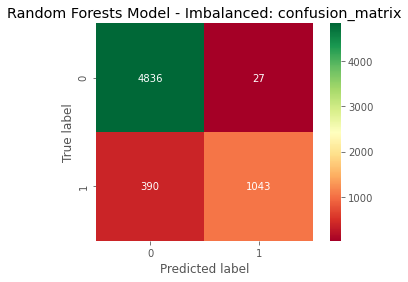

In [74]:
mat = confusion_matrix(y_test, y_pred_i_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Random Forests Model - Imbalanced: confusion_matrix');

Random Forests model - Imabalnced - AUC: 93.61065 %


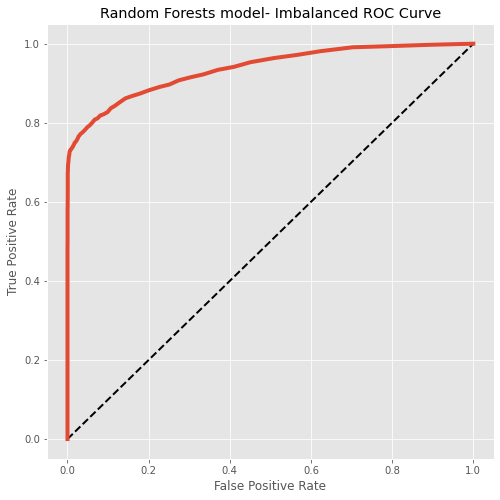

In [75]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i = rf_i_b.predict_proba(X_test)[:,1]

print("Random Forests model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_i)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='Random Forests model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forests model- Imbalanced ROC Curve')
plt.grid(True)
plt.show();

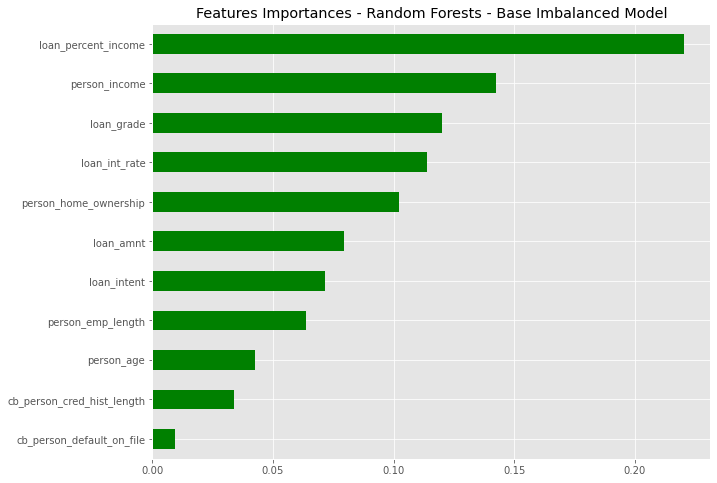

In [76]:
# First, let's create a pd.Series of features importances
importances_rf_i_b = pd.Series(data=rf_i_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_rf_i_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - Random Forests - Base Imbalanced Model')
plt.grid(True)
plt.show()

#### 2.2 Fitting a Random Forests Model: Balanced Target Variable

In [77]:
from sklearn.ensemble import RandomForestClassifier

# Declare a variable called rf_b_b, and assign it: RandomForestClassifier:
rf_b_b = RandomForestClassifier(random_state = 1981)

# Call fit() on rf_b_b:
rf_b_b.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_b_b 
y_pred_b_b = rf_b_b.predict(X_test)

In [78]:
# Create predictions of probability for loan status using test data
preds_b_b = rf_b_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_b_b = pd.DataFrame(preds_b_b[:,1][0:20], columns = ['prob_default'])
true_df_b_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_b_b.reset_index(drop = True), preds_df_b_b], axis = 1))

    loan_status  prob_default
0             0          0.02
1             0          0.06
2             0          0.09
3             1          0.09
4             0          0.06
5             1          0.97
6             0          0.00
7             0          0.19
8             1          0.06
9             0          0.12
10            1          0.92
11            0          0.16
12            1          0.11
13            0          0.02
14            1          0.98
15            0          0.00
16            0          0.02
17            0          0.02
18            0          0.06
19            0          0.18


In [79]:
# Run this block for model evaluation metrics 
print("Random Forests Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('\n')
print("Random Forests Model - Balanced: classification report")
print(classification_report(y_test, y_pred_b_b, digits=6))

Random Forests Model - Balanced
Accuracy: 93.02732 %


Random Forests Model - Balanced: classification report
              precision    recall  f1-score   support

           0   0.928848  0.985194  0.956192      4863
           1   0.936731  0.743894  0.829249      1433

    accuracy                       0.930273      6296
   macro avg   0.932790  0.864544  0.892721      6296
weighted avg   0.930643  0.930273  0.927299      6296



In [80]:
# Create a dataframe for the probabilities of default
preds_df_b_b = pd.DataFrame(preds_b_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_b_b['loan_status'] = preds_df_b_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("Random Forests Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_b_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_b_b['loan_status'], target_names=target_names, digits=6))

Random Forests Model - Balanced
Accuracy: 93.02732 %
********************************************************
0    5158
1    1138
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.928848  0.985194  0.956192      4863
     Default   0.936731  0.743894  0.829249      1433

    accuracy                       0.930273      6296
   macro avg   0.932790  0.864544  0.892721      6296
weighted avg   0.930643  0.930273  0.927299      6296



In [81]:
print('Random Forests Model - Balanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_b_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

Random Forests Model - Balanced: confusion_matrix


Predicted     0     1   All
True                       
0          4791    72  4863
1           367  1066  1433
All        5158  1138  6296


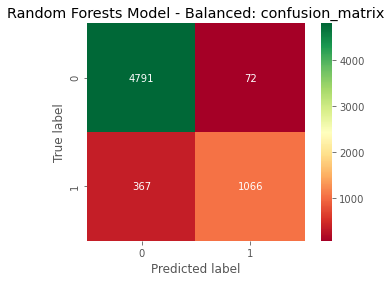

In [82]:
mat = confusion_matrix(y_test, y_pred_b_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Random Forests Model - Balanced: confusion_matrix');

Random Forests model - Balnced - AUC: 93.49221 %


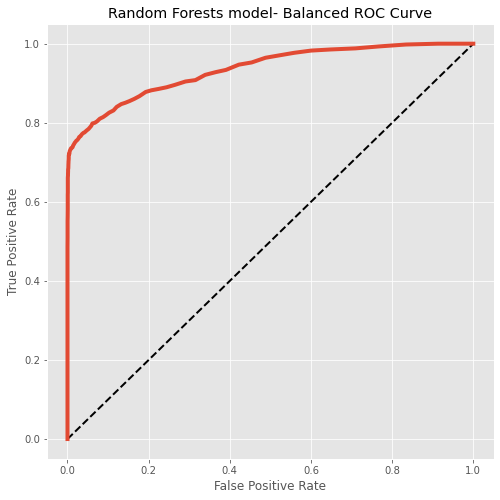

In [83]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b = rf_b_b.predict_proba(X_test)[:,1]

print("Random Forests model - Balnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_b)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='Random Forests model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forests model- Balanced ROC Curve')
plt.grid(True)
plt.show();

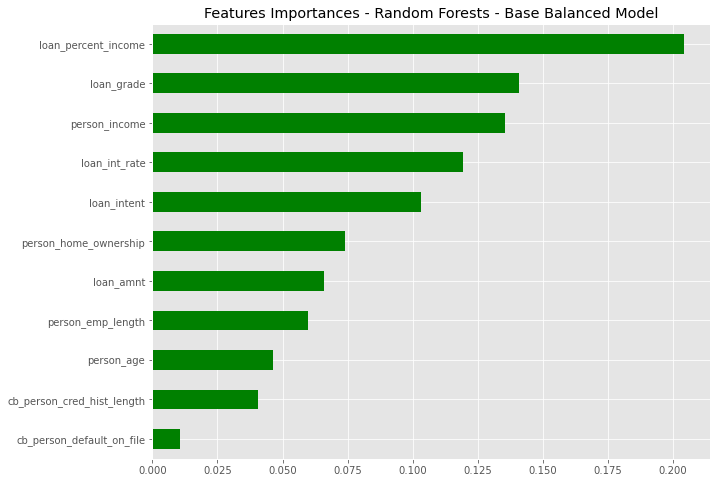

In [84]:
# First, let's create a pd.Series of features importances
importances_rf_b_b = pd.Series(data=rf_b_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_rf_b_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - Random Forests - Base Balanced Model')
plt.grid(True)
plt.show()

#### 2.3 Random Forests Model: Hyperparameters Tuning Using Optuna (Imbalanced Target Variable)

In [208]:
def objective(trial):
    
    rfc_n_estimators  = trial.suggest_int("rfc_n_estimators", 100, 1000, step=50)
    rfc_max_depth  = trial.suggest_int("rfc_max_depth", 5, 30, step=1)
    rfc_min_samples_split   = trial.suggest_int("rfc_min_samples_split", 2, 32, step=2)
    rfc_min_samples_leaf  = trial.suggest_int("rfc_min_samples_leaf", 1, 35, step=1)
    rfc_max_features  = trial.suggest_categorical("rfc_max_features",['auto', 'sqrt', 'log2'])
    classifier_obj = RandomForestClassifier(n_estimators=rfc_n_estimators, 
                                            max_depth=rfc_max_depth,
                                            min_samples_split = rfc_min_samples_split,
                                            min_samples_leaf=rfc_min_samples_leaf,
                                            max_features=rfc_max_features,
                                            random_state=1981)

    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [209]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 11:34:33,618] A new study created in memory with name: no-name-1b384027-8cf7-47fd-ad4c-7542f2960139


Optimizing the parameters


[I 2022-01-19 11:34:51,630] Trial 0 finished with value: 0.9246039771804293 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 16, 'rfc_min_samples_split': 22, 'rfc_min_samples_leaf': 6, 'rfc_max_features': 'sqrt'}. Best is trial 0 with value: 0.9246039771804293.
[I 2022-01-19 11:35:05,686] Trial 1 finished with value: 0.9203152652936968 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 11, 'rfc_min_samples_split': 28, 'rfc_min_samples_leaf': 28, 'rfc_max_features': 'log2'}. Best is trial 0 with value: 0.9246039771804293.
[I 2022-01-19 11:35:24,686] Trial 2 finished with value: 0.924603935132723 and parameters: {'rfc_n_estimators': 950, 'rfc_max_depth': 26, 'rfc_min_samples_split': 10, 'rfc_min_samples_leaf': 7, 'rfc_max_features': 'log2'}. Best is trial 0 with value: 0.9246039771804293.
[I 2022-01-19 11:35:41,161] Trial 3 finished with value: 0.9203682313879682 and parameters: {'rfc_n_estimators': 800, 'rfc_max_depth': 11, 'rfc_min_samples_split': 22, 'rfc_min_samples

[I 2022-01-19 11:44:02,836] Trial 29 finished with value: 0.9250804758062403 and parameters: {'rfc_n_estimators': 450, 'rfc_max_depth': 28, 'rfc_min_samples_split': 4, 'rfc_min_samples_leaf': 7, 'rfc_max_features': 'auto'}. Best is trial 28 with value: 0.9276219232817169.
[I 2022-01-19 11:44:21,751] Trial 30 finished with value: 0.925451070275313 and parameters: {'rfc_n_estimators': 550, 'rfc_max_depth': 25, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 6, 'rfc_max_features': 'auto'}. Best is trial 28 with value: 0.9276219232817169.
[I 2022-01-19 11:44:45,964] Trial 31 finished with value: 0.9272512727490355 and parameters: {'rfc_n_estimators': 650, 'rfc_max_depth': 24, 'rfc_min_samples_split': 8, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'auto'}. Best is trial 28 with value: 0.9276219232817169.
[I 2022-01-19 11:45:07,990] Trial 32 finished with value: 0.9261924133883822 and parameters: {'rfc_n_estimators': 600, 'rfc_max_depth': 28, 'rfc_min_samples_split': 8, 'rfc_min_sampl

[I 2022-01-19 11:55:47,311] Trial 58 finished with value: 0.9225390563625678 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 30, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 14, 'rfc_max_features': 'log2'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 11:56:17,930] Trial 59 finished with value: 0.9250804617903381 and parameters: {'rfc_n_estimators': 1000, 'rfc_max_depth': 26, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 6, 'rfc_max_features': 'sqrt'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 11:56:34,161] Trial 60 finished with value: 0.927357204937578 and parameters: {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 2, 'rfc_max_features': 'log2'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 11:57:00,146] Trial 61 finished with value: 0.926086411120329 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 25, 'rfc_min_samples_split': 24, 'rfc_min_sam

[I 2022-01-19 12:04:54,363] Trial 87 finished with value: 0.919838850763299 and parameters: {'rfc_n_estimators': 350, 'rfc_max_depth': 29, 'rfc_min_samples_split': 4, 'rfc_min_samples_leaf': 32, 'rfc_max_features': 'auto'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 12:05:09,218] Trial 88 finished with value: 0.9276219232817169 and parameters: {'rfc_n_estimators': 400, 'rfc_max_depth': 27, 'rfc_min_samples_split': 4, 'rfc_min_samples_leaf': 2, 'rfc_max_features': 'sqrt'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 12:05:23,269] Trial 89 finished with value: 0.9250804477744359 and parameters: {'rfc_n_estimators': 400, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 6, 'rfc_max_features': 'sqrt'}. Best is trial 43 with value: 0.9283102021891997.
[I 2022-01-19 12:05:42,077] Trial 90 finished with value: 0.9274631090943162 and parameters: {'rfc_n_estimators': 500, 'rfc_max_depth': 27, 'rfc_min_samples_split': 4, 'rfc_min_samp


 Parameter Optimization took 2049.46 seconds (34.2 minutes)


BEST TRIAL : 
 FrozenTrial(number=97, values=[0.928363168283471], datetime_start=datetime.datetime(2022, 1, 19, 12, 7, 39, 317389), datetime_complete=datetime.datetime(2022, 1, 19, 12, 8, 0, 710019), params={'rfc_n_estimators': 550, 'rfc_max_depth': 30, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'sqrt'}, distributions={'rfc_n_estimators': IntUniformDistribution(high=1000, low=100, step=50), 'rfc_max_depth': IntUniformDistribution(high=30, low=5, step=1), 'rfc_min_samples_split': IntUniformDistribution(high=32, low=2, step=2), 'rfc_min_samples_leaf': IntUniformDistribution(high=35, low=1, step=1), 'rfc_max_features': CategoricalDistribution(choices=('auto', 'sqrt', 'log2'))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=97, state=TrialState.COMPLETE, value=None)


In [210]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'rfc_n_estimators': 550, 'rfc_max_depth': 30, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'sqrt'}


In [211]:
plot_optimization_history(study).show()

In [212]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['rfc_n_estimators','rfc_max_depth', 'rfc_min_samples_split', 'rfc_min_samples_leaf', 'rfc_max_features'])

In [213]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['rfc_n_estimators','rfc_max_depth', 'rfc_min_samples_split', 'rfc_min_samples_leaf', 'rfc_max_features'])

In [214]:
optuna.visualization.plot_contour(study)

In [215]:
plot_param_importances(study)

#### 2.4 Random Forests Model: Hyperparameters Tuning Using Optuna (Balanced Target Variable)

In [216]:
def objective(trial):
    
    rfc_n_estimators  = trial.suggest_int("rfc_n_estimators", 100, 1000, step=50)
    rfc_max_depth  = trial.suggest_int("rfc_max_depth", 5, 30, step=1)
    rfc_min_samples_split   = trial.suggest_int("rfc_min_samples_split", 2, 32, step=2)
    rfc_min_samples_leaf  = trial.suggest_int("rfc_min_samples_leaf", 1, 35, step=1)
    rfc_max_features  = trial.suggest_categorical("rfc_max_features",['auto', 'sqrt', 'log2'])
    classifier_obj = RandomForestClassifier(n_estimators=rfc_n_estimators, 
                                            max_depth=rfc_max_depth,
                                            min_samples_split = rfc_min_samples_split,
                                            min_samples_leaf=rfc_min_samples_leaf,
                                            max_features=rfc_max_features,
                                            random_state=1981)

    score = cross_val_score(classifier_obj, X_train_new, y_train_new, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [217]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 12:12:42,692] A new study created in memory with name: no-name-74ab1e1d-7178-4549-90f4-99c8a4279a70


Optimizing the parameters


[I 2022-01-19 12:13:25,919] Trial 0 finished with value: 0.9255362161874444 and parameters: {'rfc_n_estimators': 750, 'rfc_max_depth': 22, 'rfc_min_samples_split': 12, 'rfc_min_samples_leaf': 7, 'rfc_max_features': 'log2'}. Best is trial 0 with value: 0.9255362161874444.
[I 2022-01-19 12:14:07,582] Trial 1 finished with value: 0.9044443152324717 and parameters: {'rfc_n_estimators': 750, 'rfc_max_depth': 15, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 16, 'rfc_max_features': 'sqrt'}. Best is trial 0 with value: 0.9255362161874444.
[I 2022-01-19 12:14:55,704] Trial 2 finished with value: 0.9014846339964802 and parameters: {'rfc_n_estimators': 800, 'rfc_max_depth': 22, 'rfc_min_samples_split': 16, 'rfc_min_samples_leaf': 20, 'rfc_max_features': 'auto'}. Best is trial 0 with value: 0.9255362161874444.
[I 2022-01-19 12:15:30,995] Trial 3 finished with value: 0.8900882421347516 and parameters: {'rfc_n_estimators': 700, 'rfc_max_depth': 28, 'rfc_min_samples_split': 10, 'rfc_min_sample

[I 2022-01-19 12:32:12,558] Trial 29 finished with value: 0.9220662672281023 and parameters: {'rfc_n_estimators': 900, 'rfc_max_depth': 20, 'rfc_min_samples_split': 12, 'rfc_min_samples_leaf': 8, 'rfc_max_features': 'auto'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:33:07,087] Trial 30 finished with value: 0.9253321461260129 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 24, 'rfc_min_samples_split': 20, 'rfc_min_samples_leaf': 5, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:33:45,158] Trial 31 finished with value: 0.9399260830373993 and parameters: {'rfc_n_estimators': 550, 'rfc_max_depth': 27, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 3, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:34:20,288] Trial 32 finished with value: 0.9470699353053009 and parameters: {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 4, 'rfc_min_sa

[I 2022-01-19 12:47:42,057] Trial 58 finished with value: 0.9249579559668739 and parameters: {'rfc_n_estimators': 850, 'rfc_max_depth': 30, 'rfc_min_samples_split': 28, 'rfc_min_samples_leaf': 2, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:48:11,413] Trial 59 finished with value: 0.9446886762869801 and parameters: {'rfc_n_estimators': 450, 'rfc_max_depth': 28, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:48:46,987] Trial 60 finished with value: 0.9351975381069251 and parameters: {'rfc_n_estimators': 600, 'rfc_max_depth': 25, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 4, 'rfc_max_features': 'sqrt'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 12:49:12,829] Trial 61 finished with value: 0.9470699179484686 and parameters: {'rfc_n_estimators': 400, 'rfc_max_depth': 28, 'rfc_min_samples_split': 4, 'rfc_min_sam

[I 2022-01-19 13:06:11,766] Trial 87 finished with value: 0.9351294877535977 and parameters: {'rfc_n_estimators': 650, 'rfc_max_depth': 27, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 4, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 13:06:33,674] Trial 88 finished with value: 0.9444165038017248 and parameters: {'rfc_n_estimators': 350, 'rfc_max_depth': 30, 'rfc_min_samples_split': 6, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 13:07:25,307] Trial 89 finished with value: 0.9265227033150392 and parameters: {'rfc_n_estimators': 900, 'rfc_max_depth': 15, 'rfc_min_samples_split': 8, 'rfc_min_samples_leaf': 3, 'rfc_max_features': 'log2'}. Best is trial 12 with value: 0.9495872371741688.
[I 2022-01-19 13:07:56,227] Trial 90 finished with value: 0.8950550211579783 and parameters: {'rfc_n_estimators': 600, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samp


 Parameter Optimization took 3540.58 seconds (59.0 minutes)


BEST TRIAL : 
 FrozenTrial(number=95, values=[0.9499614678325831], datetime_start=datetime.datetime(2022, 1, 19, 13, 9, 48, 353974), datetime_complete=datetime.datetime(2022, 1, 19, 13, 10, 19, 710928), params={'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}, distributions={'rfc_n_estimators': IntUniformDistribution(high=1000, low=100, step=50), 'rfc_max_depth': IntUniformDistribution(high=30, low=5, step=1), 'rfc_min_samples_split': IntUniformDistribution(high=32, low=2, step=2), 'rfc_min_samples_leaf': IntUniformDistribution(high=35, low=1, step=1), 'rfc_max_features': CategoricalDistribution(choices=('auto', 'sqrt', 'log2'))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=95, state=TrialState.COMPLETE, value=None)


In [222]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}


In [223]:
plot_optimization_history(study).show()

In [224]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['rfc_n_estimators','rfc_max_depth', 'rfc_min_samples_split', 'rfc_min_samples_leaf', 'rfc_max_features'])

In [225]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['rfc_n_estimators','rfc_max_depth', 'rfc_min_samples_split', 'rfc_min_samples_leaf', 'rfc_max_features'])

In [226]:
optuna.visualization.plot_contour(study)

In [227]:
plot_param_importances(study)

#### 2.5 Fitting a Tuned Random Forests Model: Imbalanced Target Variable

In [229]:
'''
OPTUNA: BEST PARAMETERS : 
        {'rfc_n_estimators': 550, 'rfc_max_depth': 30, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'sqrt'}
'''

# Declare a variable called rfc_i_t, and assign it: RandomForestClassifier:
rfc_i_t = RandomForestClassifier(n_estimators=550,
                                 max_depth=30,
                                 min_samples_split=2, 
                                 min_samples_leaf=1,
                                 max_features='sqrt',
                                 random_state=1981)

# Call fit() on rfc_i_t:
rfc_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = rfc_i_t.predict(X_test)

print("Tuned Random Forests Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned Random Forests Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = rfc_i_t.predict_proba(X_test)[:,1]

print("Tuned Random Forestsn model - Imbalanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")

Tuned Random Forests Model - Imbalanced
Accuracy: 93.42440 %
***********************************
Tuned Random Forests Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4837    26  4863
1           388  1045  1433
All        5225  1071  6296
***********************************
              precision    recall  f1-score   support

           0   0.925742  0.994654  0.958961      4863
           1   0.975724  0.729239  0.834665      1433

    accuracy                       0.934244      6296
   macro avg   0.950733  0.861946  0.896813      6296
weighted avg   0.937118  0.934244  0.930671      6296

***********************************
Tuned Random Forestsn model - Imbalanced - AUC: 93.89325 %


#### 2.6 Fitting a Tuned Random Forests Model: Imbalanced Target Variable

In [231]:
'''
OPTUNA: BEST PARAMETERS : 
         {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}
'''

# Declare a variable called rfc_i_t, and assign it: RandomForestClassifier:
rfc_b_t = RandomForestClassifier(n_estimators=500,
                                 max_depth=28,
                                 min_samples_split=2, 
                                 min_samples_leaf=1,
                                 max_features='log2',
                                 random_state=1981)

# Call fit() on rfc_i_t:
rfc_b_t.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = rfc_b_t.predict(X_test)

print("Tuned Random Forests Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned Random Forests Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = rfc_b_t.predict_proba(X_test)[:,1]

print("Tuned Random Forests Model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

Tuned Random Forests Model - Balanced
Accuracy: 93.12262 %
***********************************
Tuned Random Forests Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          4794    69  4863
1           364  1069  1433
All        5158  1138  6296
***********************************
              precision    recall  f1-score   support

           0   0.929430  0.985811  0.956791      4863
           1   0.939367  0.745987  0.831583      1433

    accuracy                       0.931226      6296
   macro avg   0.934399  0.865899  0.894187      6296
weighted avg   0.931692  0.931226  0.928293      6296

***********************************
Tuned Random Forests Model - Balanced - AUC: 93.58199 %


### 3. XGBoost:

#### 3.1 Fitting a XGBoost Model: Imbalanced Target Variable

In [96]:
import xgboost as xgb

# Declare a variable called xgb_i_b, and assign it: XGBClassifier:
xgb_i_b = xgb.XGBClassifier(seed=1981, eval_metric='mlogloss', use_label_encoder=False)

# Call fit() on xgb_i_b:
xgb_i_b.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_b = xgb_i_b.predict(X_test)

In [97]:
# Create predictions of probability for loan status using test data
preds_i_b = xgb_i_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_i_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_i_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_i_b.reset_index(drop = True), preds_df_i_b], axis = 1))

    loan_status  prob_default
0             0      0.052354
1             0      0.000470
2             0      0.114964
3             1      0.060765
4             0      0.013365
5             1      0.993274
6             0      0.002919
7             0      0.049944
8             1      0.099903
9             0      0.033924
10            1      0.977209
11            0      0.076717
12            1      0.081242
13            0      0.003149
14            1      0.950325
15            0      0.000656
16            0      0.000241
17            0      0.000214
18            0      0.007291
19            0      0.004438


In [98]:
# Run this block for model evaluation metrics 
print("XGBoost Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('\n')
print("XGBoost Model - Imbalanced: classification report")
print(classification_report(y_test, y_pred_i_b, digits=6))

XGBoost Model - Imbalanced
Accuracy: 93.66264 %


XGBoost Model - Imbalanced: classification report
              precision    recall  f1-score   support

           0   0.933398  0.988484  0.960152      4863
           1   0.951134  0.760642  0.845289      1433

    accuracy                       0.936626      6296
   macro avg   0.942266  0.874563  0.902720      6296
weighted avg   0.937435  0.936626  0.934008      6296



In [99]:
# Create a dataframe for the probabilities of default
preds_df_i_b = pd.DataFrame(preds_i_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_i_b['loan_status'] = preds_df_i_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("XGBoost Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_i_b['loan_status'], target_names=target_names, digits=6))

XGBoost Model - Imbalanced
Accuracy: 93.66264 %
********************************************************
0    5150
1    1146
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.933398  0.988484  0.960152      4863
     Default   0.951134  0.760642  0.845289      1433

    accuracy                       0.936626      6296
   macro avg   0.942266  0.874563  0.902720      6296
weighted avg   0.937435  0.936626  0.934008      6296



In [100]:
print('XGBoost Model - Imabalanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_i_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

XGBoost Model - Imabalanced: confusion_matrix


Predicted     0     1   All
True                       
0          4807    56  4863
1           343  1090  1433
All        5150  1146  6296


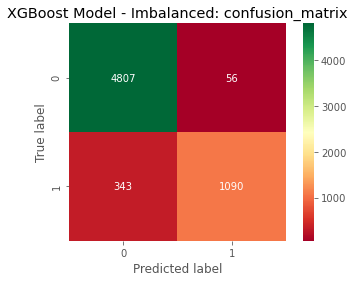

In [101]:
mat = confusion_matrix(y_test, y_pred_i_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('XGBoost Model - Imbalanced: confusion_matrix');

XGBoost model - Imabalnced - AUC: 95.23204 %


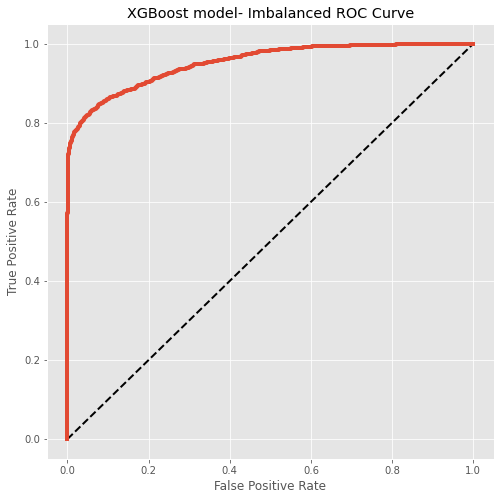

In [102]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i = xgb_i_b.predict_proba(X_test)[:,1]

print("XGBoost model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_i)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='XGBoost model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost model- Imbalanced ROC Curve')
plt.grid(True)
plt.show();

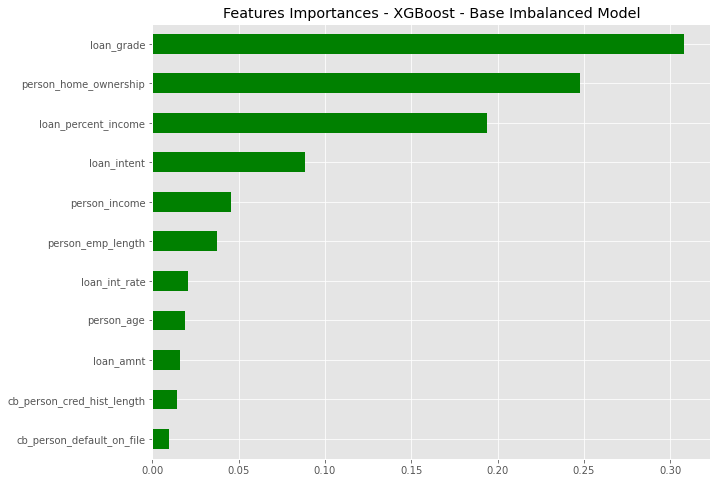

In [103]:
# First, let's create a pd.Series of features importances
importances_xgb_i_b = pd.Series(data=xgb_i_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_xgb_i_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - XGBoost - Base Imbalanced Model')
plt.grid(True)
plt.show()

#### 3.2 Fitting a XGBoost Model: Balanced Target Variable

In [106]:


# Declare a variable called xgb_b_b, and assign it: XGBClassifier:
xgb_b_b = xgb.XGBClassifier(seed=1981, eval_metric='mlogloss', use_label_encoder=False)

# Call fit() on xgb_b_b:
xgb_b_b.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_b = xgb_b_b.predict(X_test)

In [107]:
# Create predictions of probability for loan status using test data
preds_b_b = xgb_b_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_b_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_b_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_b_b.reset_index(drop = True), preds_df_b_b], axis = 1))

    loan_status  prob_default
0             0      0.052354
1             0      0.000470
2             0      0.114964
3             1      0.060765
4             0      0.013365
5             1      0.993274
6             0      0.002919
7             0      0.049944
8             1      0.099903
9             0      0.033924
10            1      0.977209
11            0      0.076717
12            1      0.081242
13            0      0.003149
14            1      0.950325
15            0      0.000656
16            0      0.000241
17            0      0.000214
18            0      0.007291
19            0      0.004438


In [108]:
# Run this block for model evaluation metrics 
print("XGBoost Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('\n')
print("XGBoost Model - Balanced: classification report")
print(classification_report(y_test, y_pred_b_b, digits=6))

XGBoost Model - Balanced
Accuracy: 93.40851 %


XGBoost Model - Balanced: classification report
              precision    recall  f1-score   support

           0   0.931175  0.987662  0.958587      4863
           1   0.947276  0.752268  0.838584      1433

    accuracy                       0.934085      6296
   macro avg   0.939225  0.869965  0.898586      6296
weighted avg   0.934840  0.934085  0.931274      6296



In [109]:
# Create a dataframe for the probabilities of default
preds_df_b_b = pd.DataFrame(preds_b_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_b_b['loan_status'] = preds_df_b_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("XGBoost Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_b_b['loan_status'], target_names=target_names, digits=6))

XGBoost Model - Balanced
Accuracy: 93.40851 %
********************************************************
0    5150
1    1146
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.931175  0.987662  0.958587      4863
     Default   0.947276  0.752268  0.838584      1433

    accuracy                       0.934085      6296
   macro avg   0.939225  0.869965  0.898586      6296
weighted avg   0.934840  0.934085  0.931274      6296



In [110]:
print('XGBoost Model - Balanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_b_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

XGBoost Model - Balanced: confusion_matrix


Predicted     0     1   All
True                       
0          4803    60  4863
1           355  1078  1433
All        5158  1138  6296


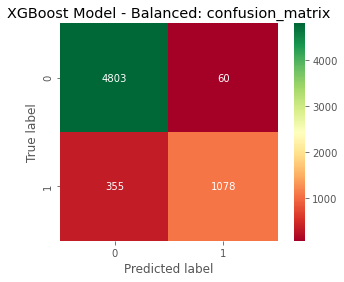

In [111]:
mat = confusion_matrix(y_test, y_pred_b_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('XGBoost Model - Balanced: confusion_matrix');

XGBoost model - Balnced - AUC: 95.04171 %


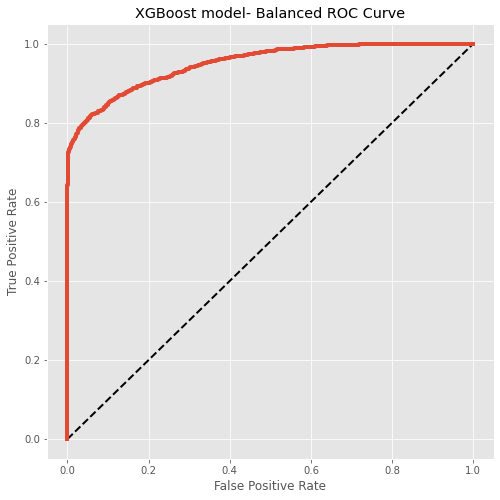

In [112]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b = xgb_b_b.predict_proba(X_test)[:,1]

print("XGBoost model - Balnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_b)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='XGBoost model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost model- Balanced ROC Curve')
plt.grid(True)
plt.show();

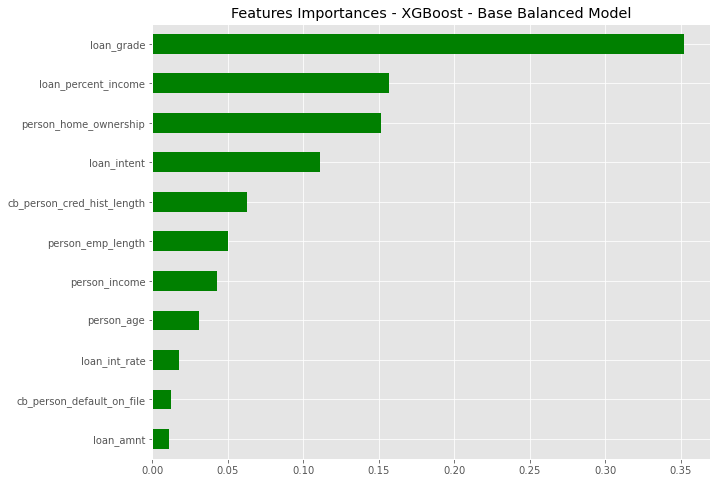

In [113]:
# First, let's create a pd.Series of features importances
importances_xgb_b_b = pd.Series(data=xgb_b_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_xgb_b_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - XGBoost - Base Balanced Model')
plt.grid(True)
plt.show()

#### 3.3 XGBoost Model: Hyperparameters Tuning Using Optuna (Imbalanced Target Variable)

In [26]:
def objective(trial):
    
    xgb_n_estimators  = trial.suggest_int("xgb_n_estimators", 100, 1100, step=100)
    xgb_max_depth = trial.suggest_int("xgb_max_depth", 6, 22, step=2)
    xgb_learning_rate = trial.suggest_float("xgb_learning_rate", 0.3, 2.1, step=0.3)  
    xgb_gamma = trial.suggest_float("xgb_gamma", 0, 1, step=0.05)
    xgb_min_child_weight = trial.suggest_int("xgb_min_child_weight",1, 12, step=1)
    xgb_colsample_bytree = trial.suggest_float("xgb_colsample_bytree", 0, 1, step=0.25)
    classifier_obj = xgb.XGBClassifier(n_estimators=xgb_n_estimators, 
                                        max_depth=xgb_max_depth,
                                        learning_rate = xgb_learning_rate,
                                        gamma=xgb_gamma,
                                        min_child_weight=xgb_min_child_weight,
                                        colsample_bytree=xgb_colsample_bytree,
                                        seed=1981)

    
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [27]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 15:21:08,957] A new study created in memory with name: no-name-a91fd1b6-563d-468f-8bd4-1784495e22e6


Optimizing the parameters


[I 2022-01-19 15:21:28,612] Trial 0 finished with value: 0.9015720656342273 and parameters: {'xgb_n_estimators': 600, 'xgb_max_depth': 20, 'xgb_learning_rate': 1.8, 'xgb_gamma': 0.6000000000000001, 'xgb_min_child_weight': 3, 'xgb_colsample_bytree': 1.0}. Best is trial 0 with value: 0.9015720656342273.
[I 2022-01-19 15:21:39,712] Trial 1 finished with value: 0.8991899649504335 and parameters: {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 1.8, 'xgb_gamma': 0.30000000000000004, 'xgb_min_child_weight': 11, 'xgb_colsample_bytree': 0.5}. Best is trial 0 with value: 0.9015720656342273.
[I 2022-01-19 15:21:41,614] Trial 2 finished with value: 0.885476694147646 and parameters: {'xgb_n_estimators': 200, 'xgb_max_depth': 14, 'xgb_learning_rate': 1.2, 'xgb_gamma': 0.05, 'xgb_min_child_weight': 4, 'xgb_colsample_bytree': 0.0}. Best is trial 0 with value: 0.9015720656342273.
[I 2022-01-19 15:21:46,260] Trial 3 finished with value: 0.8975483804414812 and parameters: {'xgb_n_esti

[I 2022-01-19 15:35:15,144] Trial 27 finished with value: 0.9265631059687701 and parameters: {'xgb_n_estimators': 900, 'xgb_max_depth': 12, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.9, 'xgb_min_child_weight': 11, 'xgb_colsample_bytree': 1.0}. Best is trial 4 with value: 0.9297929024312405.
[I 2022-01-19 15:36:00,046] Trial 28 finished with value: 0.9274631651579248 and parameters: {'xgb_n_estimators': 1000, 'xgb_max_depth': 22, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.7000000000000001, 'xgb_min_child_weight': 10, 'xgb_colsample_bytree': 0.75}. Best is trial 4 with value: 0.9297929024312405.
[I 2022-01-19 15:36:48,601] Trial 29 finished with value: 0.9254513505933563 and parameters: {'xgb_n_estimators': 700, 'xgb_max_depth': 20, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.55, 'xgb_min_child_weight': 4, 'xgb_colsample_bytree': 1.0}. Best is trial 4 with value: 0.9297929024312405.
[I 2022-01-19 15:37:26,214] Trial 30 finished with value: 0.9283631542675689 and parameters: {'xgb_n_estimators':

[I 2022-01-19 15:48:08,506] Trial 54 finished with value: 0.927674875360086 and parameters: {'xgb_n_estimators': 500, 'xgb_max_depth': 8, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.25, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 44 with value: 0.9306927653977649.
[I 2022-01-19 15:48:23,524] Trial 55 finished with value: 0.9290513490796387 and parameters: {'xgb_n_estimators': 400, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 3, 'xgb_colsample_bytree': 0.75}. Best is trial 44 with value: 0.9306927653977649.
[I 2022-01-19 15:48:27,382] Trial 56 finished with value: 0.9253452642298898 and parameters: {'xgb_n_estimators': 200, 'xgb_max_depth': 6, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.15000000000000002, 'xgb_min_child_weight': 2, 'xgb_colsample_bytree': 0.5}. Best is trial 44 with value: 0.9306927653977649.
[I 2022-01-19 15:48:36,290] Trial 57 finished with value: 0.9287338188161524 and parameters: {'xgb

[I 2022-01-19 15:54:14,267] Trial 81 finished with value: 0.9310633318350334 and parameters: {'xgb_n_estimators': 500, 'xgb_max_depth': 6, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.45, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 75 with value: 0.9319635031514055.
[I 2022-01-19 15:54:25,006] Trial 82 finished with value: 0.9310633318350334 and parameters: {'xgb_n_estimators': 500, 'xgb_max_depth': 6, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.45, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 75 with value: 0.9319635031514055.
[I 2022-01-19 15:54:37,781] Trial 83 finished with value: 0.9311164521042284 and parameters: {'xgb_n_estimators': 600, 'xgb_max_depth': 6, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.5, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 75 with value: 0.9319635031514055.
[I 2022-01-19 15:54:50,582] Trial 84 finished with value: 0.9311164521042284 and parameters: {'xgb_n_estimators': 600, 'xgb_max_


 Parameter Optimization took 2320.56 seconds (38.7 minutes)


BEST TRIAL : 
 FrozenTrial(number=98, values=[0.9322812016057179], datetime_start=datetime.datetime(2022, 1, 19, 15, 58, 59, 620018), datetime_complete=datetime.datetime(2022, 1, 19, 15, 59, 25, 451298), params={'xgb_n_estimators': 700, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}, distributions={'xgb_n_estimators': IntUniformDistribution(high=1100, low=100, step=100), 'xgb_max_depth': IntUniformDistribution(high=22, low=6, step=2), 'xgb_learning_rate': DiscreteUniformDistribution(high=2.1, low=0.3, q=0.3), 'xgb_gamma': DiscreteUniformDistribution(high=1.0, low=0.0, q=0.05), 'xgb_min_child_weight': IntUniformDistribution(high=12, low=1, step=1), 'xgb_colsample_bytree': DiscreteUniformDistribution(high=1.0, low=0.0, q=0.25)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=98, state=TrialState.COMPLETE, value=None)


In [28]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'xgb_n_estimators': 700, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}


In [29]:
plot_optimization_history(study).show()

In [30]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['xgb_n_estimators', 'xgb_max_depth', 'xgb_learning_rate', 'xgb_gamma', 'xgb_min_child_weight', 'xgb_colsample_bytree'])

In [31]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['xgb_n_estimators', 'xgb_max_depth', 'xgb_learning_rate', 'xgb_gamma', 'xgb_min_child_weight', 'xgb_colsample_bytree'])

In [32]:
optuna.visualization.plot_contour(study)

In [33]:
plot_param_importances(study)

#### 3.4 XGBoost Model: Hyperparameters Tuning Using Optuna (Balanced Target Variable)

In [34]:
def objective(trial):
    
    xgb_n_estimators  = trial.suggest_int("xgb_n_estimators", 100, 1100, step=100)
    xgb_max_depth = trial.suggest_int("xgb_max_depth", 6, 22, step=2)
    xgb_learning_rate = trial.suggest_float("xgb_learning_rate", 0.3, 2.1, step=0.3)  
    xgb_gamma = trial.suggest_float("xgb_gamma", 0, 1, step=0.05)
    xgb_min_child_weight = trial.suggest_int("xgb_min_child_weight",1, 12, step=1)
    xgb_colsample_bytree = trial.suggest_float("xgb_colsample_bytree", 0, 1, step=0.25)
    classifier_obj = xgb.XGBClassifier(n_estimators=xgb_n_estimators, 
                                        max_depth=xgb_max_depth,
                                        learning_rate = xgb_learning_rate,
                                        gamma=xgb_gamma,
                                        min_child_weight=xgb_min_child_weight,
                                        colsample_bytree=xgb_colsample_bytree,
                                        seed=1981)

    
    
    score = cross_val_score(classifier_obj, X_train_new, y_train_new, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [35]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 16:39:50,591] A new study created in memory with name: no-name-c7613f8b-ed8a-4989-8dc9-bd96ae795a84


Optimizing the parameters


[I 2022-01-19 16:40:15,798] Trial 0 finished with value: 0.930571832407057 and parameters: {'xgb_n_estimators': 600, 'xgb_max_depth': 14, 'xgb_learning_rate': 1.5, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 12, 'xgb_colsample_bytree': 0.75}. Best is trial 0 with value: 0.930571832407057.
[I 2022-01-19 16:40:24,248] Trial 1 finished with value: 0.9416617315407197 and parameters: {'xgb_n_estimators': 200, 'xgb_max_depth': 6, 'xgb_learning_rate': 0.8999999999999999, 'xgb_gamma': 0.7000000000000001, 'xgb_min_child_weight': 6, 'xgb_colsample_bytree': 1.0}. Best is trial 1 with value: 0.9416617315407197.
[I 2022-01-19 16:40:31,614] Trial 2 finished with value: 0.9254017759510675 and parameters: {'xgb_n_estimators': 300, 'xgb_max_depth': 16, 'xgb_learning_rate': 1.2, 'xgb_gamma': 0.30000000000000004, 'xgb_min_child_weight': 8, 'xgb_colsample_bytree': 0.25}. Best is trial 1 with value: 0.9416617315407197.
[I 2022-01-19 16:40:34,030] Trial 3 finished with value: 0.9140056965123181

[I 2022-01-19 16:50:45,527] Trial 27 finished with value: 0.9510505916944088 and parameters: {'xgb_n_estimators': 300, 'xgb_max_depth': 20, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.75, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 1.0}. Best is trial 22 with value: 0.9512210473575381.
[I 2022-01-19 16:51:14,951] Trial 28 finished with value: 0.9484991720791054 and parameters: {'xgb_n_estimators': 200, 'xgb_max_depth': 22, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.75, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 22 with value: 0.9512210473575381.
[I 2022-01-19 16:52:16,735] Trial 29 finished with value: 0.9397564489309926 and parameters: {'xgb_n_estimators': 600, 'xgb_max_depth': 20, 'xgb_learning_rate': 1.2, 'xgb_gamma': 0.8500000000000001, 'xgb_min_child_weight': 2, 'xgb_colsample_bytree': 0.75}. Best is trial 22 with value: 0.9512210473575381.
[I 2022-01-19 16:52:34,459] Trial 30 finished with value: 0.9506763841784375 and parameters: {'xgb_n_estimators

[I 2022-01-19 17:03:46,776] Trial 54 finished with value: 0.9516969774812459 and parameters: {'xgb_n_estimators': 300, 'xgb_max_depth': 20, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.65, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 54 with value: 0.9516969774812459.
[I 2022-01-19 17:04:38,090] Trial 55 finished with value: 0.9487033809951946 and parameters: {'xgb_n_estimators': 400, 'xgb_max_depth': 20, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.55, 'xgb_min_child_weight': 9, 'xgb_colsample_bytree': 1.0}. Best is trial 54 with value: 0.9516969774812459.
[I 2022-01-19 17:05:17,497] Trial 56 finished with value: 0.9460158548876262 and parameters: {'xgb_n_estimators': 300, 'xgb_max_depth': 20, 'xgb_learning_rate': 0.6, 'xgb_gamma': 0.8, 'xgb_min_child_weight': 2, 'xgb_colsample_bytree': 0.75}. Best is trial 54 with value: 0.9516969774812459.
[I 2022-01-19 17:05:59,024] Trial 57 finished with value: 0.9462538864840034 and parameters: {'xgb_n_estimators': 300, 'xgb_ma

[I 2022-01-19 17:32:30,365] Trial 81 finished with value: 0.9519352057883876 and parameters: {'xgb_n_estimators': 800, 'xgb_max_depth': 16, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.75, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 71 with value: 0.952003256141715.
[I 2022-01-19 17:34:09,174] Trial 82 finished with value: 0.9523774000159684 and parameters: {'xgb_n_estimators': 800, 'xgb_max_depth': 16, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.8, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 82 with value: 0.9523774000159684.
[I 2022-01-19 17:35:34,060] Trial 83 finished with value: 0.9529217276296469 and parameters: {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}. Best is trial 83 with value: 0.9529217276296469.
[I 2022-01-19 17:37:10,929] Trial 84 finished with value: 0.9511527250805069 and parameters: {'xgb_n_estimators'


 Parameter Optimization took 4719.64 seconds (78.7 minutes)


BEST TRIAL : 
 FrozenTrial(number=83, values=[0.9529217276296469], datetime_start=datetime.datetime(2022, 1, 19, 17, 34, 9, 174653), datetime_complete=datetime.datetime(2022, 1, 19, 17, 35, 34, 60649), params={'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}, distributions={'xgb_n_estimators': IntUniformDistribution(high=1100, low=100, step=100), 'xgb_max_depth': IntUniformDistribution(high=22, low=6, step=2), 'xgb_learning_rate': DiscreteUniformDistribution(high=2.1, low=0.3, q=0.3), 'xgb_gamma': DiscreteUniformDistribution(high=1.0, low=0.0, q=0.05), 'xgb_min_child_weight': IntUniformDistribution(high=12, low=1, step=1), 'xgb_colsample_bytree': DiscreteUniformDistribution(high=1.0, low=0.0, q=0.25)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=83, state=TrialState.COMPLETE, value=None)


In [36]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}


In [37]:
plot_optimization_history(study).show()

In [38]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['xgb_n_estimators', 'xgb_max_depth', 'xgb_learning_rate', 'xgb_gamma', 'xgb_min_child_weight', 'xgb_colsample_bytree'])

In [39]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['xgb_n_estimators', 'xgb_max_depth', 'xgb_learning_rate', 'xgb_gamma', 'xgb_min_child_weight', 'xgb_colsample_bytree'])

In [40]:
optuna.visualization.plot_contour(study)

In [41]:
plot_param_importances(study)

#### 3.5 Fitting a Tuned XGBoost Model: Imbalanced Target Variable

In [43]:
'''
OPTUNA: BEST PARAMETERS : 
        {'xgb_n_estimators': 700, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
xgb_i_t = xgb.XGBClassifier(n_estimators=700,
                            max_depth=10,
                            learning_rate=0.3,
                            gamma=0.35000000000000003,
                            min_child_weight=1,
                            colsample_bytree=0.75,
                            seed=1981)

# Call fit() on logreg_i_t:
xgb_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = xgb_i_t.predict(X_test)

print("Tuned XGBoost Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned XGBoost Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = xgb_i_t.predict_proba(X_test)[:,1]

print("Tuned XGBoost model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")

C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:04:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XGBoost Model - Imbalanced
Accuracy: 93.53558 %
***********************************
Tuned XGBoost Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4783    80  4863
1           327  1106  1433
All        5110  1186  6296
***********************************
              precision    recall  f1-score   support

           0   0.936008  0.983549  0.959190      4863
           1   0.932546  0.771807  0.844597      1433

    accuracy                       0.935356      6296
   macro avg   0.934277  0.877678  0.901893      6296
weighted avg   0.935220  0.935356  0.933108      6296

***********************************
Tuned XGB

#### 3.6 Fitting a Tuned XGBoost Model: Balanced Target Variable

In [44]:
'''
OPTUNA: BEST PARAMETERS : 
         {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
xgb_b_t = xgb.XGBClassifier(n_estimators=800,
                            max_depth=14,
                            learning_rate=0.3,
                            gamma=0.9500000000000001,
                            min_child_weight=1,
                            colsample_bytree=0.75,
                            seed=1981)

# Call fit() on logreg_i_t:
xgb_b_t.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = xgb_b_t.predict(X_test)

print("Tuned XGBoost Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned XGBoost Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = xgb_b_t.predict_proba(X_test)[:,1]

print("Tuned XGBoost model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:06:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XGBoost Model - Balanced
Accuracy: 93.36086 %
***********************************
Tuned XGBoost Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          4783    80  4863
1           338  1095  1433
All        5121  1175  6296
***********************************
              precision    recall  f1-score   support

           0   0.933997  0.983549  0.958133      4863
           1   0.931915  0.764131  0.839724      1433

    accuracy                       0.933609      6296
   macro avg   0.932956  0.873840  0.898928      6296
weighted avg   0.933523  0.933609  0.931183      6296

***********************************
Tuned XGBoost 

### 4. LightGBM:

#### 4.1 Fitting a LightGBM Model: Imbalanced Target Variable

In [114]:
# Import necessary modules
import lightgbm as lgb

# Declare a variable called lgb_i_b, and assign it: LGBMClassifier:
lgb_i_b = lgb.LGBMClassifier(random_state=1981)

# Call fit() on xgb_i_b:
lgb_i_b.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_b = lgb_i_b.predict(X_test)

In [115]:
# Create predictions of probability for loan status using test data
preds_i_b = lgb_i_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_i_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_i_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_i_b.reset_index(drop = True), preds_df_i_b], axis = 1))

    loan_status  prob_default
0             0      0.054030
1             0      0.000891
2             0      0.079849
3             1      0.082832
4             0      0.042534
5             1      0.987723
6             0      0.012722
7             0      0.075134
8             1      0.115743
9             0      0.042057
10            1      0.967361
11            0      0.086671
12            1      0.024449
13            0      0.022625
14            1      0.963201
15            0      0.002804
16            0      0.005742
17            0      0.004338
18            0      0.028366
19            0      0.039783


In [116]:
# Run this block for model evaluation metrics 
print("LightGBM Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('\n')
print("LightGBM Model - Imbalanced: classification report")
print(classification_report(y_test, y_pred_i_b, digits=6))

LightGBM Model - Imbalanced
Accuracy: 93.56734 %


LightGBM Model - Imbalanced: classification report
              precision    recall  f1-score   support

           0   0.928160  0.993625  0.959778      4863
           1   0.971560  0.739009  0.839477      1433

    accuracy                       0.935673      6296
   macro avg   0.949860  0.866317  0.899627      6296
weighted avg   0.938038  0.935673  0.932397      6296



In [117]:
# Create a dataframe for the probabilities of default
preds_df_i_b = pd.DataFrame(preds_i_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_i_b['loan_status'] = preds_df_i_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("LightGBM Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_i_b['loan_status'], target_names=target_names, digits=6))

LightGBM Model - Imbalanced
Accuracy: 93.56734 %
********************************************************
0    5206
1    1090
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.928160  0.993625  0.959778      4863
     Default   0.971560  0.739009  0.839477      1433

    accuracy                       0.935673      6296
   macro avg   0.949860  0.866317  0.899627      6296
weighted avg   0.938038  0.935673  0.932397      6296



In [118]:
print('LightGBM Model - Imabalanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_i_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

LightGBM Model - Imabalanced: confusion_matrix


Predicted     0     1   All
True                       
0          4832    31  4863
1           374  1059  1433
All        5206  1090  6296


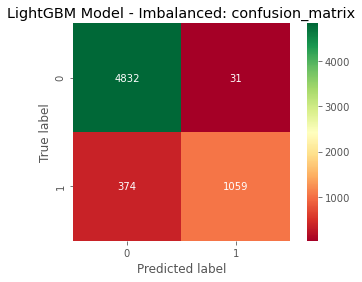

In [119]:
mat = confusion_matrix(y_test, y_pred_i_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('LightGBM Model - Imbalanced: confusion_matrix');

XGBoost model - Imabalnced - AUC: 95.23204 %


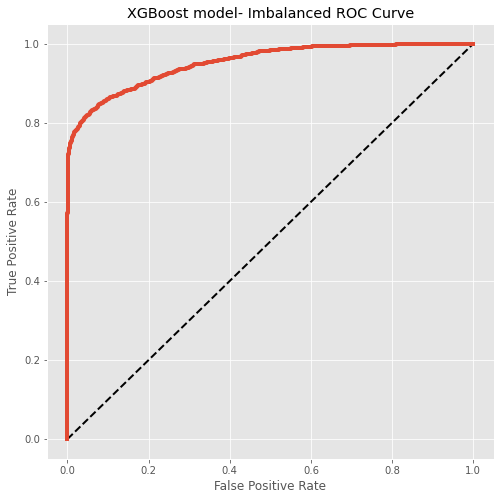

In [102]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i = lgb_i_b.predict_proba(X_test)[:,1]

print("LightGBM model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_i)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='LightGBM model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LightGBM model- Imbalanced ROC Curve')
plt.grid(True)
plt.show();

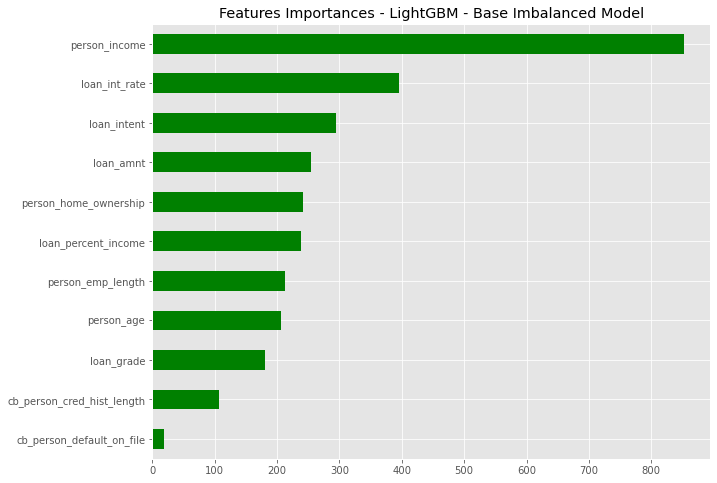

In [120]:
# First, let's create a pd.Series of features importances
importances_lgb_i_b = pd.Series(data=lgb_i_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_lgb_i_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - LightGBM - Base Imbalanced Model')
plt.grid(True)
plt.show()

#### 4.2 Fitting a LightGBM Model: Balanced Target Variable

In [121]:
# Import necessary modules
import lightgbm as lgb

# Declare a variable called lgb_b_b, and assign it: LGBMClassifier:
lgb_b_b = lgb.LGBMClassifier(random_state=1981)

# Call fit() on lgb_b_b:
lgb_b_b.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_b_b 
y_pred_b_b = lgb_b_b.predict(X_test)

In [122]:
# Create predictions of probability for loan status using test data
preds_b_b = lgb_b_b.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_b_b = pd.DataFrame(preds_b_b[:,1][0:20], columns = ['prob_default'])
true_df_b_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_b_b.reset_index(drop = True), preds_df_b_b], axis = 1))

    loan_status  prob_default
0             0      0.054030
1             0      0.000891
2             0      0.079849
3             1      0.082832
4             0      0.042534
5             1      0.987723
6             0      0.012722
7             0      0.075134
8             1      0.115743
9             0      0.042057
10            1      0.967361
11            0      0.086671
12            1      0.024449
13            0      0.022625
14            1      0.963201
15            0      0.002804
16            0      0.005742
17            0      0.004338
18            0      0.028366
19            0      0.039783


In [123]:
# Run this block for model evaluation metrics 
print("LightGBM Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('\n')
print("LightGBM Model - Balanced: classification report")
print(classification_report(y_test, y_pred_b_b, digits=6))

LightGBM Model - Balanced
Accuracy: 93.56734 %


LightGBM Model - Balanced: classification report
              precision    recall  f1-score   support

           0   0.928160  0.993625  0.959778      4863
           1   0.971560  0.739009  0.839477      1433

    accuracy                       0.935673      6296
   macro avg   0.949860  0.866317  0.899627      6296
weighted avg   0.938038  0.935673  0.932397      6296



In [124]:
# Create a dataframe for the probabilities of default
preds_df_b_b = pd.DataFrame(preds_b_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_b_b['loan_status'] = preds_df_b_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("LightGBM Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_b_b['loan_status'], target_names=target_names, digits=6))

LightGBM Model - Balanced
Accuracy: 93.56734 %
********************************************************
0    5206
1    1090
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.928160  0.993625  0.959778      4863
     Default   0.971560  0.739009  0.839477      1433

    accuracy                       0.935673      6296
   macro avg   0.949860  0.866317  0.899627      6296
weighted avg   0.938038  0.935673  0.932397      6296



In [125]:
print('LightGBM Model - Balanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_b_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

LightGBM Model - Balanced: confusion_matrix


Predicted     0     1   All
True                       
0          4832    31  4863
1           374  1059  1433
All        5206  1090  6296


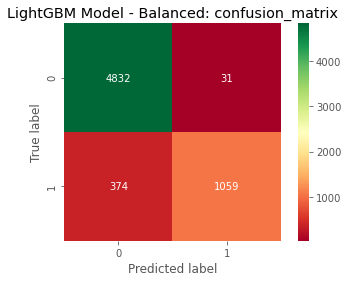

In [126]:
mat = confusion_matrix(y_test, y_pred_b_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('LightGBM Model - Balanced: confusion_matrix');

LightGBM model - Balnced - AUC: 95.04573 %


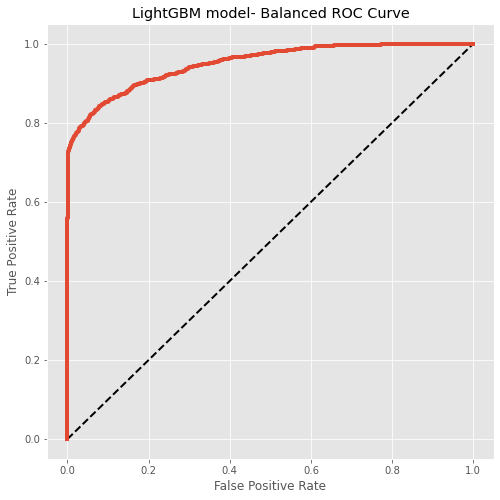

In [127]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b = lgb_b_b.predict_proba(X_test)[:,1]

print("LightGBM model - Balnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_b)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='LightGBM model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LightGBM model- Balanced ROC Curve')
plt.grid(True)
plt.show();

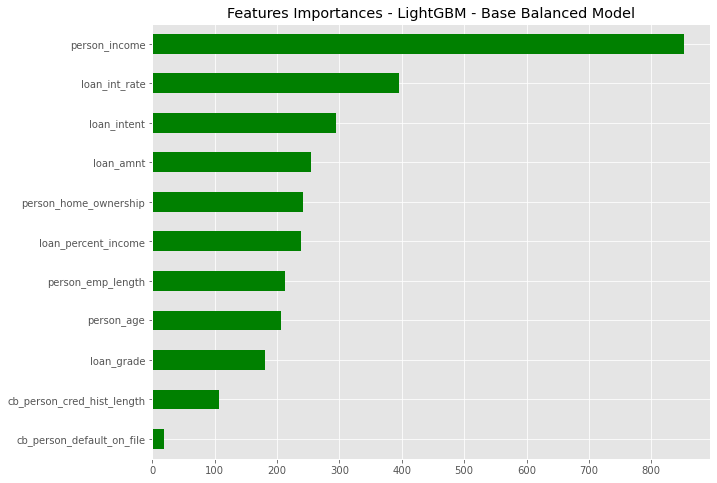

In [128]:
# First, let's create a pd.Series of features importances
importances_lgb_b_b = pd.Series(data=lgb_b_b.feature_importances_, index=X.columns)

# Sort importances
importances_sorted = importances_lgb_b_b.sort_values()

# Draw a horizontal barplot of importances_sorted
plt.figure(figsize=(10, 8))
importances_sorted.plot(kind='barh', color='green')
plt.title('Features Importances - LightGBM - Base Balanced Model')
plt.grid(True)
plt.show()

#### 4.3 LightBGM Model: Hyperparameters Tuning Using Optuna (Imbalanced Target Variable)

In [61]:
def objective(trial):
    
    lgb_n_estimators  = trial.suggest_categorical("lgb_n_estimators", [10, 50, 100, 500, 1000, 5000])
   # xgb_max_depth = trial.suggest_int("xgb_max_depth", 6, 22, step=2)
    lgb_learning_rate = trial.suggest_categorical("lgb_learning_rate", [0.01, 0.05, 0.07, 0.1, 0.3, 0.5, 0.7 , 1] )  
    lgb_boosting_type  = trial.suggest_categorical("lgb_boosting_type", ['gbdt', 'dart', 'goss'])
    lgb_reg_alpha = trial.suggest_categorical("lgb_reg_alpha",[0, 0.2, 0.4, 0.6, 0.8, 1])
    lgb_reg_lambda  = trial.suggest_categorical("lgb_reg_lambda",[0, 0.2, 0.4, 0.6, 0.8, 1])
    lgb_colsample_bytree = trial.suggest_categorical("lgb_colsample_bytree", [0.6, 0.7, 0.8, 0.9])
    classifier_obj = lgb.LGBMClassifier(n_estimators=lgb_n_estimators, 
                                        #max_depth=xgb_max_depth,
                                        learning_rate = lgb_learning_rate,
                                        boosting_type=lgb_boosting_type,
                                        reg_alpha=lgb_reg_alpha,
                                        reg_lambda=lgb_reg_lambda,
                                        colsample_bytree=lgb_colsample_bytree,
                                        seed=1981)

    
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [62]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-19 21:34:12,944] A new study created in memory with name: no-name-7c511fa1-e2d2-43e7-b53e-6e4a9f9d4c2f


Optimizing the parameters


[I 2022-01-19 21:34:36,550] Trial 0 finished with value: 0.932545863886248 and parameters: {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'goss', 'lgb_reg_alpha': 0.2, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.7}. Best is trial 0 with value: 0.932545863886248.
[I 2022-01-19 21:34:54,337] Trial 1 finished with value: 0.9328105541985826 and parameters: {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.2, 'lgb_reg_lambda': 0.4, 'lgb_colsample_bytree': 0.9}. Best is trial 1 with value: 0.9328105541985826.
[I 2022-01-19 21:34:54,544] Trial 2 finished with value: 0.8701220070267324 and parameters: {'lgb_n_estimators': 10, 'lgb_learning_rate': 0.07, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.6, 'lgb_reg_lambda': 0.2, 'lgb_colsample_bytree': 0.6}. Best is trial 1 with value: 0.9328105541985826.
[I 2022-01-19 21:40:25,361] Trial 3 finished with value: 0.9312223842927709 and parameters: {'lgb_n_estimators

[I 2022-01-19 21:51:08,812] Trial 27 finished with value: 0.9333928869016208 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.8}. Best is trial 14 with value: 0.9342400640919173.
[I 2022-01-19 21:51:11,856] Trial 28 finished with value: 0.9310104638520773 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'goss', 'lgb_reg_alpha': 0.4, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 14 with value: 0.9342400640919173.
[I 2022-01-19 21:51:14,595] Trial 29 finished with value: 0.9321750731945452 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.2, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 14 with value: 0.9342400640919173.
[I 2022-01-19 21:51:15,052] Trial 30 finished with value: 0.929951436300598 and parameters: {'lgb_n_estimator

[I 2022-01-19 23:27:56,638] Trial 54 finished with value: 0.9302161686606389 and parameters: {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.5, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 0.4, 'lgb_colsample_bytree': 0.9}. Best is trial 14 with value: 0.9342400640919173.
[I 2022-01-19 23:34:48,388] Trial 55 finished with value: 0.9343988922952203 and parameters: {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}. Best is trial 55 with value: 0.9343988922952203.
[I 2022-01-19 23:34:48,966] Trial 56 finished with value: 0.9309046157589478 and parameters: {'lgb_n_estimators': 50, 'lgb_learning_rate': 0.7, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.6}. Best is trial 55 with value: 0.9343988922952203.
[I 2022-01-19 23:35:12,279] Trial 57 finished with value: 0.9341341178874728 and parameters: {'lgb_n_estimators'

[I 2022-01-19 23:43:15,366] Trial 81 finished with value: 0.9341341178874728 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}. Best is trial 55 with value: 0.9343988922952203.
[I 2022-01-19 23:43:37,951] Trial 82 finished with value: 0.9341341178874728 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}. Best is trial 55 with value: 0.9343988922952203.
[I 2022-01-19 23:44:00,904] Trial 83 finished with value: 0.9341341178874728 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}. Best is trial 55 with value: 0.9343988922952203.
[I 2022-01-19 23:44:21,555] Trial 84 finished with value: 0.9295811081336662 and parameters: {'lgb_n_estimators': 500,


 Parameter Optimization took 8716.39 seconds (145.3 minutes)


BEST TRIAL : 
 FrozenTrial(number=55, values=[0.9343988922952203], datetime_start=datetime.datetime(2022, 1, 19, 23, 27, 56, 640390), datetime_complete=datetime.datetime(2022, 1, 19, 23, 34, 48, 386400), params={'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}, distributions={'lgb_n_estimators': CategoricalDistribution(choices=(10, 50, 100, 500, 1000, 5000)), 'lgb_learning_rate': CategoricalDistribution(choices=(0.01, 0.05, 0.07, 0.1, 0.3, 0.5, 0.7, 1)), 'lgb_boosting_type': CategoricalDistribution(choices=('gbdt', 'dart', 'goss')), 'lgb_reg_alpha': CategoricalDistribution(choices=(0, 0.2, 0.4, 0.6, 0.8, 1)), 'lgb_reg_lambda': CategoricalDistribution(choices=(0, 0.2, 0.4, 0.6, 0.8, 1)), 'lgb_colsample_bytree': CategoricalDistribution(choices=(0.6, 0.7, 0.8, 0.9))}, user_attrs={}, system_attrs={}, intermediate_values={}, t

In [63]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}


In [64]:
plot_optimization_history(study).show()

In [65]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['lgb_n_estimators','lgb_learning_rate','lgb_boosting_type','lgb_reg_alpha','lgb_reg_lambda','lgb_colsample_bytree'])

In [66]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['lgb_n_estimators','lgb_learning_rate','lgb_boosting_type','lgb_reg_alpha','lgb_reg_lambda','lgb_colsample_bytree'])

In [67]:
optuna.visualization.plot_contour(study)

In [68]:
plot_param_importances(study)

#### 4.4 LightBGM Model: Hyperparameters Tuning Using Optuna (Balanced Target Variable)

In [69]:
def objective(trial):
    
    lgb_n_estimators  = trial.suggest_categorical("lgb_n_estimators", [10, 50, 100, 500, 1000, 5000])
   # xgb_max_depth = trial.suggest_int("xgb_max_depth", 6, 22, step=2)
    lgb_learning_rate = trial.suggest_categorical("lgb_learning_rate", [0.01, 0.05, 0.07, 0.1, 0.3, 0.5, 0.7 , 1] )  
    lgb_boosting_type  = trial.suggest_categorical("lgb_boosting_type", ['gbdt', 'dart', 'goss'])
    lgb_reg_alpha = trial.suggest_categorical("lgb_reg_alpha",[0, 0.2, 0.4, 0.6, 0.8, 1])
    lgb_reg_lambda  = trial.suggest_categorical("lgb_reg_lambda",[0, 0.2, 0.4, 0.6, 0.8, 1])
    lgb_colsample_bytree = trial.suggest_categorical("lgb_colsample_bytree", [0.6, 0.7, 0.8, 0.9])
    classifier_obj = lgb.LGBMClassifier(n_estimators=lgb_n_estimators, 
                                        #max_depth=xgb_max_depth,
                                        learning_rate = lgb_learning_rate,
                                        boosting_type=lgb_boosting_type,
                                        reg_alpha=lgb_reg_alpha,
                                        reg_lambda=lgb_reg_lambda,
                                        colsample_bytree=lgb_colsample_bytree,
                                        seed=1981)

    
    
    score = cross_val_score(classifier_obj, X_train_new, y_train_new, n_jobs=-1, cv=5)
    accuracy = score.mean()
    return accuracy

In [70]:
start = time.time()
print("Optimizing the parameters")

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)


end = time.time()
duration = end - start
print ('\n Parameter Optimization took %0.2f seconds (%0.1f minutes)'%(duration, duration/60) )

print("\n\nBEST TRIAL : \n",study.best_trial) #get best trial

[I 2022-01-20 02:13:08,792] A new study created in memory with name: no-name-70153d16-ed0a-4d20-a123-ac9706d345b2


Optimizing the parameters


[I 2022-01-20 02:13:12,368] Trial 0 finished with value: 0.944281080011525 and parameters: {'lgb_n_estimators': 100, 'lgb_learning_rate': 0.5, 'lgb_boosting_type': 'goss', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0.2, 'lgb_colsample_bytree': 0.6}. Best is trial 0 with value: 0.944281080011525.
[I 2022-01-20 02:13:38,582] Trial 1 finished with value: 0.950336410121116 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 0.2, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.9}. Best is trial 1 with value: 0.950336410121116.
[I 2022-01-20 02:13:43,549] Trial 2 finished with value: 0.953159990650453 and parameters: {'lgb_n_estimators': 1000, 'lgb_learning_rate': 0.05, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.4, 'lgb_reg_lambda': 0.2, 'lgb_colsample_bytree': 0.9}. Best is trial 2 with value: 0.953159990650453.
[I 2022-01-20 02:14:52,798] Trial 3 finished with value: 0.9523435715500692 and parameters: {'lgb_n_estimators': 1000, '

[I 2022-01-20 02:17:56,905] Trial 27 finished with value: 0.8935922741268646 and parameters: {'lgb_n_estimators': 10, 'lgb_learning_rate': 0.07, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.6, 'lgb_reg_lambda': 0.6, 'lgb_colsample_bytree': 0.8}. Best is trial 4 with value: 0.9533981495302661.
[I 2022-01-20 02:18:33,298] Trial 28 finished with value: 0.9433284849915472 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.05, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 0.8, 'lgb_reg_lambda': 0.2, 'lgb_colsample_bytree': 0.7}. Best is trial 4 with value: 0.9533981495302661.
[I 2022-01-20 02:18:34,284] Trial 29 finished with value: 0.9497241883655997 and parameters: {'lgb_n_estimators': 100, 'lgb_learning_rate': 0.3, 'lgb_boosting_type': 'goss', 'lgb_reg_alpha': 0.4, 'lgb_reg_lambda': 0.2, 'lgb_colsample_bytree': 0.6}. Best is trial 4 with value: 0.9533981495302661.
[I 2022-01-20 02:18:44,072] Trial 30 finished with value: 0.9518672769328859 and parameters: {'lgb_n_estimat

[I 2022-01-20 02:22:57,966] Trial 54 finished with value: 0.9491117120432117 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.5, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.6, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:23:01,254] Trial 55 finished with value: 0.952547699467608 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.8, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.6}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:23:01,869] Trial 56 finished with value: 0.9243457631394112 and parameters: {'lgb_n_estimators': 50, 'lgb_learning_rate': 0.07, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0.4, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.9}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:23:41,359] Trial 57 finished with value: 0.9487034388513017 and parameters: {'lgb_n_estima

[I 2022-01-20 02:26:35,836] Trial 81 finished with value: 0.9530239015150201 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:26:39,269] Trial 82 finished with value: 0.9530239015150201 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:26:42,715] Trial 83 finished with value: 0.9530239015150201 and parameters: {'lgb_n_estimators': 500, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0.8, 'lgb_colsample_bytree': 0.8}. Best is trial 35 with value: 0.9534660321008825.
[I 2022-01-20 02:26:46,376] Trial 84 finished with value: 0.9530239015150201 and parameters: {'lgb_n_estimators'


 Parameter Optimization took 1037.22 seconds (17.3 minutes)


BEST TRIAL : 
 FrozenTrial(number=35, values=[0.9534660321008825], datetime_start=datetime.datetime(2022, 1, 20, 2, 20, 52, 908068), datetime_complete=datetime.datetime(2022, 1, 20, 2, 20, 58, 738600), params={'lgb_n_estimators': 1000, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.8}, distributions={'lgb_n_estimators': CategoricalDistribution(choices=(10, 50, 100, 500, 1000, 5000)), 'lgb_learning_rate': CategoricalDistribution(choices=(0.01, 0.05, 0.07, 0.1, 0.3, 0.5, 0.7, 1)), 'lgb_boosting_type': CategoricalDistribution(choices=('gbdt', 'dart', 'goss')), 'lgb_reg_alpha': CategoricalDistribution(choices=(0, 0.2, 0.4, 0.6, 0.8, 1)), 'lgb_reg_lambda': CategoricalDistribution(choices=(0, 0.2, 0.4, 0.6, 0.8, 1)), 'lgb_colsample_bytree': CategoricalDistribution(choices=(0.6, 0.7, 0.8, 0.9))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial

In [71]:
print("\n\nBEST PARAMETERS : \n",study.best_params) #get best parameters



BEST PARAMETERS : 
 {'lgb_n_estimators': 1000, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.8}


In [72]:
plot_optimization_history(study).show()

In [73]:
#Visualize the parallel coordinate
optuna.visualization.plot_parallel_coordinate(study, params=['lgb_n_estimators','lgb_learning_rate','lgb_boosting_type','lgb_reg_alpha','lgb_reg_lambda','lgb_colsample_bytree'])

In [75]:
#Visualize the slice plot
optuna.visualization.plot_slice(study, params=['lgb_n_estimators','lgb_learning_rate','lgb_boosting_type','lgb_reg_alpha','lgb_reg_lambda','lgb_colsample_bytree'])

In [76]:
optuna.visualization.plot_contour(study)

In [77]:
plot_param_importances(study)

#### 4.5 Fitting a Tuned LightBGM Model: Imbalanced Target Variable

In [78]:
'''
OPTUNA: BEST PARAMETERS : 
        {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
lgb_i_t = lgb.LGBMClassifier(n_estimators=5000,
                             learning_rate=0.01,
                             boosting_type='dart',
                             reg_alpha=1,
                             reg_lambda=1,
                             colsample_bytree=0.9,
                             random_state=1981)

# Call fit() on logreg_i_t:
lgb_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = lgb_i_t.predict(X_test)

print("Tuned LightGBM Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned LightGBM Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = lgb_i_t.predict_proba(X_test)[:,1]

print("Tuned LightGBM model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")

Tuned LightGBM Model - Imbalanced
Accuracy: 93.71029 %
***********************************
Tuned LightGBM Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4844    19  4863
1           377  1056  1433
All        5221  1075  6296
***********************************
              precision    recall  f1-score   support

           0   0.927792  0.996093  0.960730      4863
           1   0.982326  0.736916  0.842105      1433

    accuracy                       0.937103      6296
   macro avg   0.955059  0.866504  0.901418      6296
weighted avg   0.940204  0.937103  0.933730      6296

***********************************
Tuned LightGBM model - Imabalnced - AUC: 95.22020 %


#### 4.6 Fitting a Tuned LightBGM Model: Balanced Target Variable

In [79]:
'''
OPTUNA: BEST PARAMETERS : 
        {'lgb_n_estimators': 1000, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.8}
'''

# Declare a variable called logreg_i_t, and assign it: LogisticRegression:
lgb_b_t = lgb.LGBMClassifier(n_estimators=1000,
                             learning_rate=0.1,
                             boosting_type='gbdt',
                             reg_alpha=0,
                             reg_lambda=0,
                             colsample_bytree=0.8,
                             random_state=1981)

# Call fit() on logreg_i_t:
lgb_b_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = lgb_b_t.predict(X_test)

print("Tuned LightGBM Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned LightGBM Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = lgb_b_t.predict_proba(X_test)[:,1]

print("Tuned LightGBM model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

Tuned LightGBM Model - Balanced
Accuracy: 93.74206 %
***********************************
Tuned LightGBM Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          4808    55  4863
1           339  1094  1433
All        5147  1149  6296
***********************************
              precision    recall  f1-score   support

           0   0.934136  0.988690  0.960639      4863
           1   0.952132  0.763433  0.847405      1433

    accuracy                       0.937421      6296
   macro avg   0.943134  0.876062  0.904022      6296
weighted avg   0.938232  0.937421  0.934867      6296

***********************************
Tuned LightGBM model - Balanced - AUC: 95.41381 %


### 5. One-Layer Stacking Classifier:

#### 5.1 Fitting a One-Layer Stacking Classifier Model: Imbalanced Target Variable

In [80]:
from sklearn.ensemble import StackingClassifier

# Create below Classifiers: 
rfc_i_b = RandomForestClassifier(random_state = 1981)
xgbc_i_b = xgb.XGBClassifier(seed=1981)
lgbc_i_b = lgb.LGBMClassifier(random_state=1981)


# Get these models in a list
estimators = [('Random Forest', rfc_i_b),
              ('XGB', xgbc_i_b),
              ('lightGBM', lgbc_i_b)
             ]

#Stack these models with StackingClassifier
stacking = StackingClassifier(estimators=estimators, n_jobs =-1, verbose = 1,
                              final_estimator=LogisticRegression(random_state=1981))
                                       
                                       
# Fit the regressor to the training data
stacking.fit(X_train, y_train)

StackingClassifier(estimators=[('Random Forest',
                                RandomForestClassifier(random_state=1981)),
                               ('XGB',
                                XGBClassifier(base_score=None, booster=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None, gamma=None,
                                              gpu_id=None,
                                              importance_type='gain',
                                              interaction_constraints=None,
                                              learning_rate=None,
                                              max_delta_step=None,
                                              max_depth=None,
                                              min_child_weig...
                                              monotone_constraints=None,
  

In [131]:
# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_b = stacking.predict(X_test)

In [132]:
# Create predictions of probability for loan status using test data
preds_i_b = stacking.predict_proba(X_test)

# Create dataframes of first 20 predictions, and first 20 true labels
preds_df_i_b = pd.DataFrame(preds_i_b[:,1][0:20], columns = ['prob_default'])
true_df_i_b = y_test.head(20)

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df_i_b.reset_index(drop = True), preds_df_i_b], axis = 1))

    loan_status  prob_default
0             0      0.044142
1             0      0.030433
2             0      0.062378
3             1      0.056229
4             0      0.039685
5             1      0.991798
6             0      0.031480
7             0      0.056100
8             1      0.064277
9             0      0.043305
10            1      0.989945
11            0      0.061781
12            1      0.044833
13            0      0.033321
14            1      0.989400
15            0      0.029881
16            0      0.030111
17            0      0.029976
18            0      0.036212
19            0      0.039014


In [133]:
# Run this block for model evaluation metrics 
print("Stacking Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('\n')
print("Stacking Model - Imbalanced: classification report")
print(classification_report(y_test, y_pred_i_b, digits=6))

Stacking Model - Imbalanced
Accuracy: 93.71029 %


Stacking Model - Imbalanced: classification report
              precision    recall  f1-score   support

           0   0.933101  0.989513  0.960479      4863
           1   0.955224  0.759246  0.846034      1433

    accuracy                       0.937103      6296
   macro avg   0.944162  0.874379  0.903257      6296
weighted avg   0.938136  0.937103  0.934431      6296



In [134]:
# Create a dataframe for the probabilities of default
preds_df_i_b = pd.DataFrame(preds_i_b[:,1], columns = ['prob_default'])

# Reassign loan status based on the threshold
preds_df_i_b['loan_status'] = preds_df_i_b['prob_default'].apply(lambda x: 1 if x > 0.50 else 0)

print("Stacking Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_b) *100), "%")
print('********************************************************')

# Print the row counts for each loan status
print(preds_df_i_b['loan_status'].value_counts())
print('********************************************************')
# Print the classification report
target_names = ['Non-Default', 'Default']
print(classification_report(y_test, preds_df_i_b['loan_status'], target_names=target_names, digits=6))

Stacking Model - Imbalanced
Accuracy: 93.71029 %
********************************************************
0    5157
1    1139
Name: loan_status, dtype: int64
********************************************************
              precision    recall  f1-score   support

 Non-Default   0.933101  0.989513  0.960479      4863
     Default   0.955224  0.759246  0.846034      1433

    accuracy                       0.937103      6296
   macro avg   0.944162  0.874379  0.903257      6296
weighted avg   0.938136  0.937103  0.934431      6296



In [135]:
print('Stacking Model - Imabalanced: confusion_matrix')
print('\n')
print(pd.crosstab(y_test.ravel(), y_pred_i_b.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

Stacking Model - Imabalanced: confusion_matrix


Predicted     0     1   All
True                       
0          4812    51  4863
1           345  1088  1433
All        5157  1139  6296


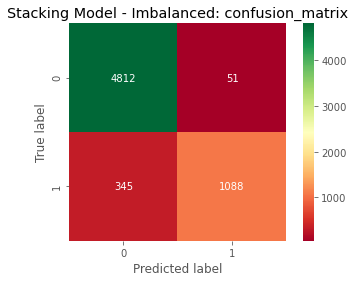

In [136]:
mat = confusion_matrix(y_test, y_pred_i_b)
sns.heatmap(mat, square=True, annot=True, fmt='d', cmap='RdYlGn')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Stacking Model - Imbalanced: confusion_matrix');

Stacking model - Imabalnced - AUC: 95.31222 %


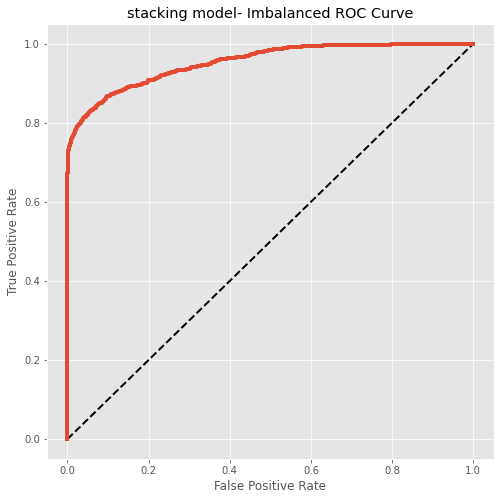

In [137]:
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i = stacking.predict_proba(X_test)[:,1]

print("Stacking model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i) * 100), "%")

# Generate ROC curve values: fpr, tpr, thresholds:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_i)
# Plot ROC curve:
plt.subplots(figsize = (8,8))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.plot(fpr, tpr, label='stacking model', linewidth=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('stacking model- Imbalanced ROC Curve')
plt.grid(True)
plt.show();

In [140]:
# package used to calculate Shap values
import shap
shap.initjs()
X_train_summary = shap.kmeans(X_train, 10)

In [141]:
# Create object that can calculate shap values using .kernalExplainer():
explainer_stacking  = shap.KernelExplainer(stacking.predict, X_train_summary)

# calculate shap values. This is what we will plot.
# Calculate shap_values for all of X_test rather than a single row, to have more data for plot.
shap_values_stacking_test = explainer_stacking.shap_values(X_test)

  0%|          | 0/6296 [00:00<?, ?it/s]

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
Usage of np.ndarray subset (sliced data) is not recommended due to it wi

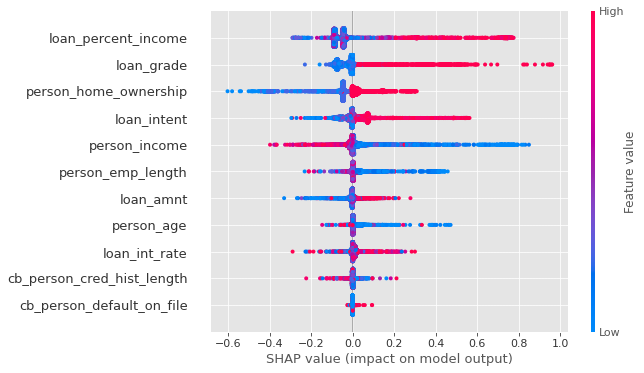

In [142]:
# Now, let's creates a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output.
# Features are sorted by the sum of the SHAP value magnitudes across all samples:
shap.summary_plot(shap_values_stacking_test, X_test, feature_names=X.columns.tolist())

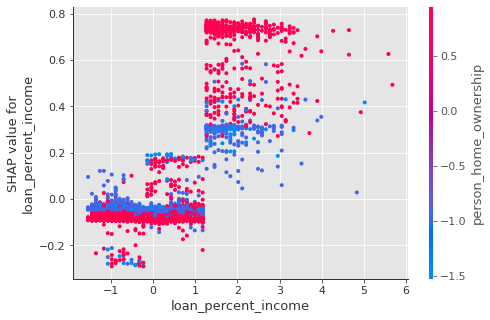

In [150]:
# The first argument is the index of the feature we want to plot
# The second argument is the matrix of SHAP values (it is the same shape as the data matrix)
# The third argument is the data matrix (a pandas dataframe or numpy array)
# If we pass a numpy array instead of a data frame then we
# need pass the feature names in separately
shap.dependence_plot('rank(0)', shap_values_stacking_test, X_test, feature_names=X.columns) # 'rank(0)' corresponds to feature "loan_percent_income"

## 6. Tuned Stacking Classifier: One-Layer Stacking Classifiers



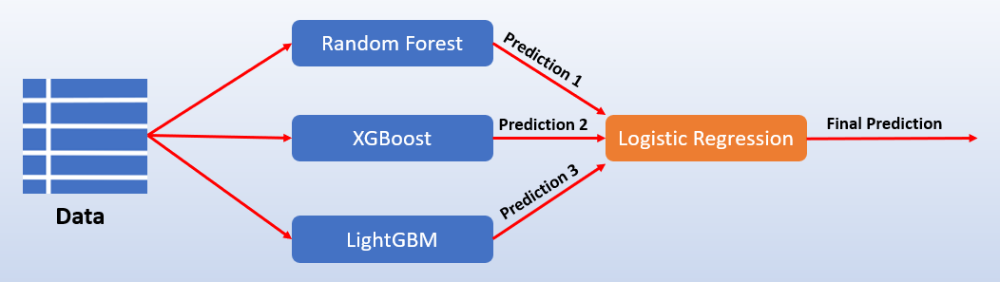

### 6.1 Tunded One-Layer Stacking Classifier: Imbalanced Target Variable

In [82]:
#### Optuna Hyperparameters Results: 
'''
logistic regression:
imbalanced:
BEST PARAMETERS : 
 {'logreg_max_iter': 600, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}
balanced:
BEST PARAMETERS : 
 {'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}

Random Forests:

imbalanced
BEST PARAMETERS : 
 {'rfc_n_estimators': 550, 'rfc_max_depth': 30, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'sqrt'}
balanced:
BEST PARAMETERS : 
 {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}

XGBoost
imbalanced
BEST PARAMETERS : 
 {'xgb_n_estimators': 700, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}
balanced:
BEST PARAMETERS : 
 {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}

LightGBM
imbalanced
BEST PARAMETERS : 
 {'lgb_n_estimators': 5000, 'lgb_learning_rate': 0.01, 'lgb_boosting_type': 'dart', 'lgb_reg_alpha': 1, 'lgb_reg_lambda': 1, 'lgb_colsample_bytree': 0.9}
Balanced:
BEST PARAMETERS : 
 {'lgb_n_estimators': 1000, 'lgb_learning_rate': 0.1, 'lgb_boosting_type': 'gbdt', 'lgb_reg_alpha': 0, 'lgb_reg_lambda': 0, 'lgb_colsample_bytree': 0.8}
 '''

"\nlogistic regression:\nimbalanced:\nBEST PARAMETERS : \n {'logreg_max_iter': 600, 'logreg_solver': 'liblinear', 'logreg_class_weight': None}\nbalanced:\nBEST PARAMETERS : \n {'logreg_max_iter': 600, 'logreg_solver': 'saga', 'logreg_class_weight': None}\n\nRandom Forests:\n\nimbalanced\nBEST PARAMETERS : \n {'rfc_n_estimators': 550, 'rfc_max_depth': 30, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'sqrt'}\nbalanced:\nBEST PARAMETERS : \n {'rfc_n_estimators': 500, 'rfc_max_depth': 28, 'rfc_min_samples_split': 2, 'rfc_min_samples_leaf': 1, 'rfc_max_features': 'log2'}\n\nXGBoost\nimbalanced\nBEST PARAMETERS : \n {'xgb_n_estimators': 700, 'xgb_max_depth': 10, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.35000000000000003, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree': 0.75}\nbalanced:\nBEST PARAMETERS : \n {'xgb_n_estimators': 800, 'xgb_max_depth': 14, 'xgb_learning_rate': 0.3, 'xgb_gamma': 0.9500000000000001, 'xgb_min_child_weight': 1, 'xgb_colsample_bytree'

In [84]:
# Create below Classifiers: 
rfc_i_t = RandomForestClassifier(n_estimators=550, max_depth=30,min_samples_split=2,min_samples_leaf=1,max_features='sqrt',random_state = 1981)
xgbc_i_t = xgb.XGBClassifier(n_estimators=700, max_depth=10,learning_rate=0.3,gamma=0.35,min_child_weight=1,colsample_bytree=0.75,seed=1981)
lgbc_i_t = lgb.LGBMClassifier(n_estimators=5000, learning_rate=0.01,boosting_type='dart',reg_alpha=1,reg_lambda=1,colsample_bytree=0.9,random_state=1981)


# Get these models in a list
estimators_i_t = [('Random Forest', rfc_i_t),
              ('XGB', xgbc_i_t),
              ('lightGBM', lgbc_i_t)
             ]

#Stack these models with StackingClassifier
stacking_i_t = StackingClassifier(estimators=estimators_i_t, n_jobs =-1, verbose = 1,
                              final_estimator=LogisticRegression(max_iter=600, solver='liblinear',random_state=1981))
                                       
                                       
# Fit the regressor to the training data
stacking_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = stacking_i_t.predict(X_test)

print("Tuned One-Layer Stacking Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned One-Layer Stacking Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = stacking_i_t.predict_proba(X_test)[:,1]

print("Tuned One-Layer Stacking model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")


Tuned One-Layer Stacking Model - Imbalanced
Accuracy: 93.69441 %
***********************************
Tuned One-Layer Stacking Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4812    51  4863
1           346  1087  1433
All        5158  1138  6296
***********************************
              precision    recall  f1-score   support

           0   0.932920  0.989513  0.960383      4863
           1   0.955185  0.758548  0.845585      1433

    accuracy                       0.936944      6296
   macro avg   0.944052  0.874031  0.902984      6296
weighted avg   0.937987  0.936944  0.934255      6296

***********************************
Tuned One-Layer Stacking model - Imabalnced - AUC: 95.34757 %


### 6.2 Tunded One-Layer Stacking Classifier: Balanced Target Variable

In [85]:
# Create below Classifiers: 
rfc_b_t = RandomForestClassifier(n_estimators=500, max_depth=28,min_samples_split=2,min_samples_leaf=1,max_features='log2',random_state = 1981)
xgbc_b_t = xgb.XGBClassifier(n_estimators=800, max_depth=14,learning_rate=0.3,gamma=0.95,min_child_weight=1,colsample_bytree=0.75,seed=1981)
lgbc_b_t = lgb.LGBMClassifier(n_estimators=1000, learning_rate=0.1,boosting_type='gbdt',reg_alpha=0,reg_lambda=0,colsample_bytree=0.8,random_state=1981)


# Get these models in a list
estimators_b_t = [('Random Forest', rfc_b_t),
                  ('XGB', xgbc_b_t),
                  ('lightGBM', lgbc_b_t)
                 ]

#Stack these models with StackingClassifier
stacking_b_t = StackingClassifier(estimators=estimators_b_t, n_jobs =-1, verbose = 2,
                                 final_estimator=LogisticRegression(max_iter=600, solver='saga',random_state=1981))
                                       
                                       
# Fit the regressor to the training data
stacking_b_t.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = stacking_b_t.predict(X_test)

print("Tuned One-Layer Stacking Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned One-Layer Stacking Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = stacking_b_t.predict_proba(X_test)[:,1]

print("Tuned One-Layer Stacking model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

Tuned One-Layer Stacking Model - Balanced
Accuracy: 93.26557 %
***********************************
Tuned One-Layer Stacking Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          4772    91  4863
1           333  1100  1433
All        5105  1191  6296
***********************************
              precision    recall  f1-score   support

           0   0.934770  0.981287  0.957464      4863
           1   0.923594  0.767620  0.838415      1433

    accuracy                       0.932656      6296
   macro avg   0.929182  0.874454  0.897939      6296
weighted avg   0.932226  0.932656  0.930368      6296

***********************************
Tuned One-Layer Stacking model - Balanced - AUC: 94.25502 %


## 7. Tuned Stacking Classifier: Multi-Layer Stacking Classifiers



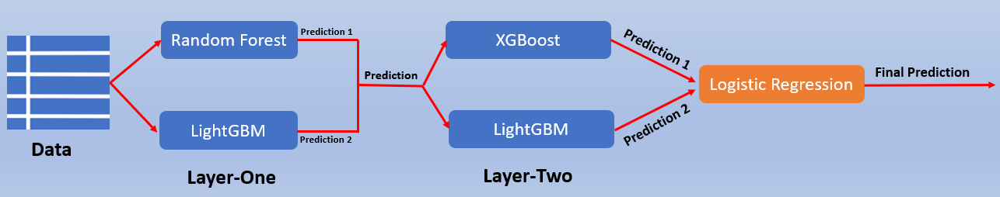

### 7.1 Tunded Multi-Layer Stacking Classifier: Imbalanced Target Variable

In [86]:
# Create below Classifiers: 
rfc_i_t = RandomForestClassifier(n_estimators=550, max_depth=30,min_samples_split=2,min_samples_leaf=1,max_features='sqrt',random_state = 1981)
xgbc_i_t = xgb.XGBClassifier(n_estimators=700, max_depth=10,learning_rate=0.3,gamma=0.35,min_child_weight=1,colsample_bytree=0.75,seed=1981)
lgbc_i_t = lgb.LGBMClassifier(n_estimators=5000, learning_rate=0.01,boosting_type='dart',reg_alpha=1,reg_lambda=1,colsample_bytree=0.9,random_state=1981)


# Get these models in a list
layer_One_estimator_i_t = [('Random Forest', rfc_i_t),
                           ('lightGBM', lgbc_i_t)
                          ]

layer_Two_estimator_i_t = [
                           ('XGB', xgbc_i_t),
                           ('lightGBM', lgbc_i_t)
                          ]

layer_two = StackingClassifier(estimators=layer_Two_estimator_i_t, final_estimator=LogisticRegression(max_iter=600, solver='liblinear',random_state=1981))

#Stack these models with StackingClassifier
final_stacking_i_t = StackingClassifier(estimators=layer_One_estimator_i_t, n_jobs =-1, verbose = 1,
                                        final_estimator=layer_two)
                                       
                                       
# Fit the regressor to the training data
final_stacking_i_t.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_i_t = final_stacking_i_t.predict(X_test)

print("Tuned Multi-Layer Stacking Model - Imbalanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_i_t) *100), "%")

print('***********************************')
print('Tuned Multi-Layer Stacking Model - Imabalanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_i_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_i_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_i_t = stacking_i_t.predict_proba(X_test)[:,1]

print("Tuned Multi-Layer Stacking model - Imabalnced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_i_t) * 100), "%")

C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:56:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:58:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:58:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:58:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:58:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned Multi-Layer Stacking Model - Imbalanced
Accuracy: 93.44028 %
***********************************
Tuned Multi-Layer Stacking Model - Imabalanced: confusion_matrix
Predicted     0     1   All
True                       
0          4816    47  4863
1           366  1067  1433
All        5182  1114  6296
***********************************
              precision    recall  f1-score   support

           0   0.929371  0.990335  0.958885      4863
           1   0.957810  0.744592  0.837848      1433

    accuracy                       0.934403      6296
   macro avg   0.943590  0.867463  0.898367      6296
weighted avg   0.935844  0.934403  0.931337      6296

*******************

### 7.2 Tunded Multi-Layer Stacking Classifier: Balanced Target Variable

In [87]:
# Create below Classifiers: 
rfc_b_t = RandomForestClassifier(n_estimators=500, max_depth=28,min_samples_split=2,min_samples_leaf=1,max_features='log2',random_state = 1981)
xgbc_b_t = xgb.XGBClassifier(n_estimators=800, max_depth=14,learning_rate=0.3,gamma=0.95,min_child_weight=1,colsample_bytree=0.75,seed=1981)
lgbc_b_t = lgb.LGBMClassifier(n_estimators=1000, learning_rate=0.1,boosting_type='gbdt',reg_alpha=0,reg_lambda=0,colsample_bytree=0.8,random_state=1981)


# Get these models in a list
layer_One_estimator_b_t = [('Random Forest', rfc_b_t),
                           ('lightGBM', lgbc_b_t)
                          ]

layer_Two_estimator_b_t = [
                           ('XGB', xgbc_b_t),
                           ('lightGBM', lgbc_b_t)
                          ]

layer_two_b_t = StackingClassifier(estimators=layer_Two_estimator_b_t, final_estimator=LogisticRegression(max_iter=600, solver='liblinear',random_state=1981))

#Stack these models with StackingClassifier
final_stacking_b_t = StackingClassifier(estimators=layer_One_estimator_b_t, n_jobs =-1, verbose = 1,
                                        final_estimator=layer_two_b_t)
                                       
                                       
# Fit the regressor to the training data
final_stacking_b_t.fit(X_train_new, y_train_new)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred_i_b 
y_pred_b_t = final_stacking_b_t.predict(X_test)

print("Tuned Multi-Layer Stacking Model - Balanced")
print("Accuracy: {:0.5f}".format(metrics.accuracy_score(y_test,y_pred_b_t) *100), "%")

print('***********************************')
print('Tuned Multi-Layer Stacking Model - Balanced: confusion_matrix')
print(pd.crosstab(y_test.ravel(), y_pred_b_t.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))
print('***********************************')
print(classification_report(y_test, y_pred_b_t, digits=6))
print('***********************************')
# Compute predicted probabilities: y_pred_prob:
y_pred_prob_b_t = final_stacking_b_t.predict_proba(X_test)[:,1]

print("Tuned Multi-Layer Stacking model - Balanced - AUC: {:0.5f}".format(roc_auc_score(y_test, y_pred_prob_b_t) * 100), "%")

C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:16:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:16:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:16:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:17:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:17:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\aktha\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:17:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned Multi-Layer Stacking Model - Balanced
Accuracy: 93.05909 %
***********************************
Tuned Multi-Layer Stacking Model - Balanced: confusion_matrix
Predicted     0     1   All
True                       
0          4773    90  4863
1           347  1086  1433
All        5120  1176  6296
***********************************
              precision    recall  f1-score   support

           0   0.932227  0.981493  0.956226      4863
           1   0.923469  0.757851  0.832503      1433

    accuracy                       0.930591      6296
   macro avg   0.927848  0.869672  0.894364      6296
weighted avg   0.930233  0.930591  0.928066      6296

************************

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))